# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [22]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](https://upload.wikimedia.org/wikipedia/commons/2/27/MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [23]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [24]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [25]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [26]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [27]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [28]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device) == device

test_get_noise(1000, 100, 'cpu')
try:
    test_get_noise(1000, 32, 'cuda')
except Exception as e: 
    print(e)
print("Success!")

Torch not compiled with CUDA enabled
Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](https://drive.google.com/uc?export=view&id=1ePf0x1EkkK0Ll0V5lxsZQl5aJ1cEOYOr)  |  ![](https://drive.google.com/uc?export=view&id=1Qp0aiob39MKPGVw6OecYXBhhlx-c-MpB)





In [29]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(inplace=True),
        #### END CODE HERE ####
    )

In [30]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    #assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    #assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    #assert -test_output.min() / test_output.max() > 0.1
    #assert -test_output.min() / test_output.max() < 0.3
    #assert test_output.std() > 0.3
    #assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [31]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [32]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [35]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cpu'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [36]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [37]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    noise=get_noise(num_images, z_dim, device=device)
    fake=gen(noise)
    fake_pred=disc(fake.detach())
    fake_loss=criterion(fake_pred, torch.zeros_like(fake_pred))
    real_pred=disc(real)
    real_loss=criterion(real_pred, torch.ones_like(real_pred))
    disc_loss=(fake_loss+real_loss)/2
    #### END CODE HERE ####
    return disc_loss

In [38]:
def test_disc_reasonable(num_images=10):
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu') - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [39]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise=get_noise(num_images, z_dim, device=device)
    fake=gen(noise)
    disc_fake_pred=disc(fake)
    gen_loss=criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [40]:
def test_gen_reasonable(num_images=10):
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    assert torch.all(torch.abs(get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu') - 1) < 1e-5)

def test_gen_loss(num_images):
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))

test_gen_reasonable()
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

  6%|▋         | 30/469 [00:02<00:37, 11.63it/s]

Step 500: Generator loss: 7.67716121673584, discriminator loss: 0.018235744908452034


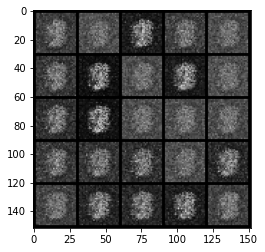

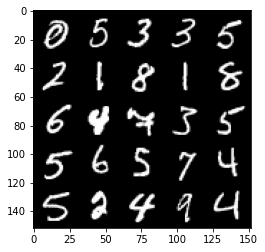

 13%|█▎        | 62/469 [00:05<00:34, 11.75it/s]

Step 1000: Generator loss: 5.530930042266846, discriminator loss: 0.010676220059394836


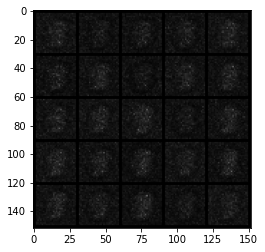

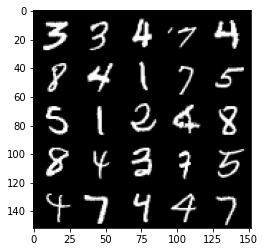

 20%|█▉        | 92/469 [00:07<00:32, 11.55it/s]

Step 1500: Generator loss: 3.8744335174560547, discriminator loss: 0.013792436569929123


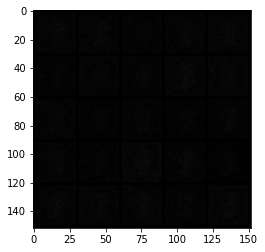

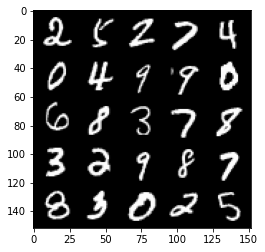

 26%|██▋       | 124/469 [00:10<00:29, 11.70it/s]

Step 2000: Generator loss: 3.2440223693847656, discriminator loss: 0.023882444947957993


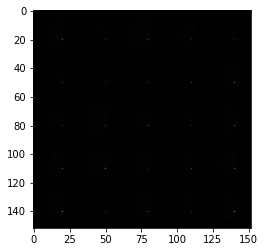

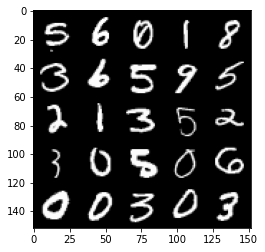

 33%|███▎      | 154/469 [00:13<00:27, 11.65it/s]

Step 2500: Generator loss: 3.516263723373413, discriminator loss: 0.0209940318018198


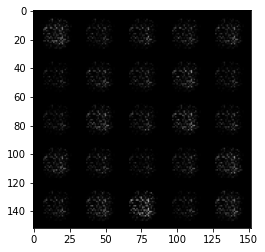

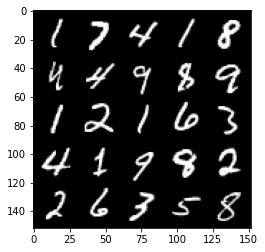

 40%|███▉      | 186/469 [00:16<00:24, 11.53it/s]

Step 3000: Generator loss: 3.7436769008636475, discriminator loss: 0.09926790744066238


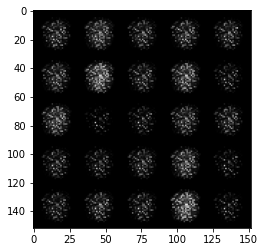

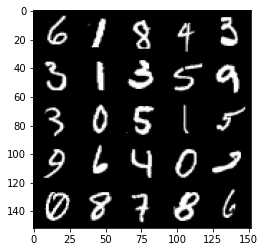

 46%|████▌     | 216/469 [00:18<00:21, 11.64it/s]

Step 3500: Generator loss: 3.539827585220337, discriminator loss: 0.3060321509838104


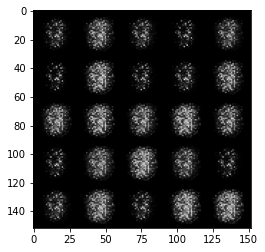

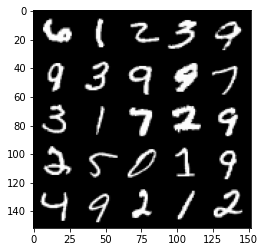

 53%|█████▎    | 248/469 [00:21<00:19, 11.57it/s]

Step 4000: Generator loss: 1.914609432220459, discriminator loss: 0.30767038464546204


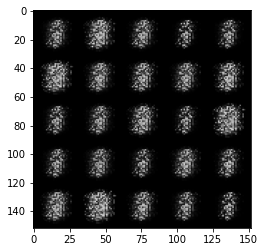

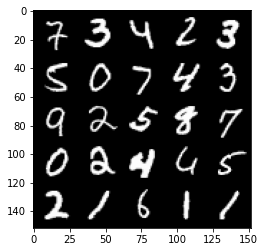

 59%|█████▉    | 278/469 [00:24<00:16, 11.59it/s]

Step 4500: Generator loss: 1.807820200920105, discriminator loss: 0.30621352791786194


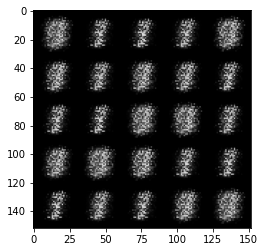

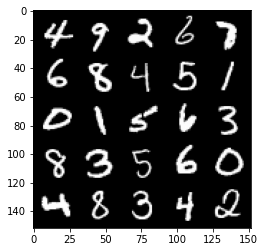

 66%|██████▌   | 310/469 [00:26<00:13, 11.54it/s]

Step 5000: Generator loss: 1.8977707624435425, discriminator loss: 0.27411729097366333


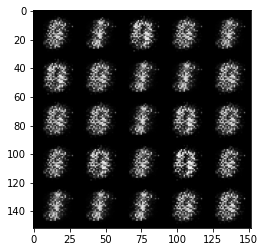

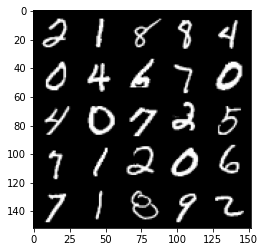

 73%|███████▎  | 341/469 [00:29<00:10, 11.67it/s]

Step 5500: Generator loss: 1.9618583917617798, discriminator loss: 0.26432231068611145


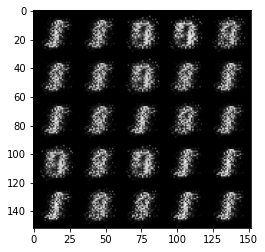

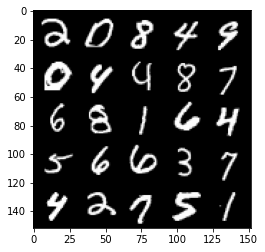

 79%|███████▉  | 372/469 [00:32<00:08, 11.30it/s]

Step 6000: Generator loss: 2.227888345718384, discriminator loss: 0.2116619199514389


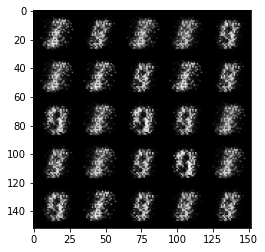

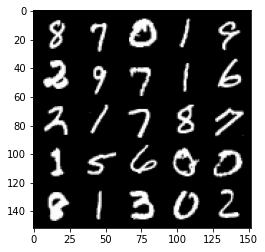

 86%|████████▌ | 402/469 [00:34<00:05, 11.68it/s]

Step 6500: Generator loss: 2.468379497528076, discriminator loss: 0.1777559518814087


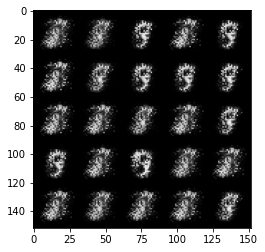

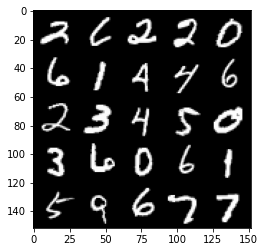

 93%|█████████▎| 434/469 [00:37<00:03, 11.65it/s]

Step 7000: Generator loss: 2.2572410106658936, discriminator loss: 0.17676801979541779


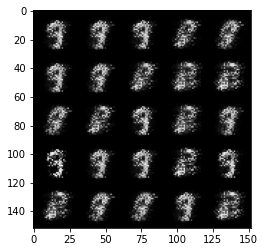

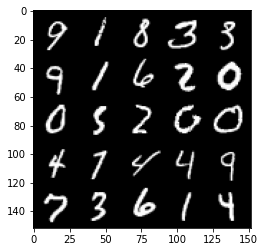

 99%|█████████▉| 464/469 [00:39<00:00, 11.69it/s]

Step 7500: Generator loss: 2.1006522178649902, discriminator loss: 0.20515194535255432


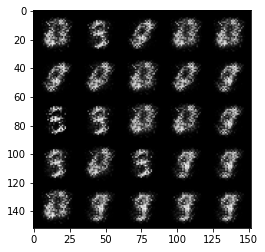

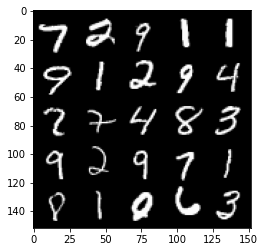

  6%|▌         | 26/469 [00:02<00:37, 11.66it/s]

Step 8000: Generator loss: 2.0066585540771484, discriminator loss: 0.2242395132780075


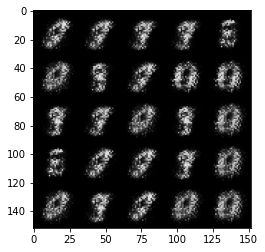

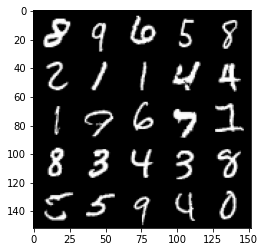

 12%|█▏        | 58/469 [00:05<00:35, 11.54it/s]

Step 8500: Generator loss: 2.088127851486206, discriminator loss: 0.20531079173088074


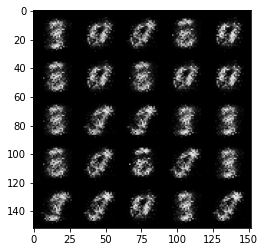

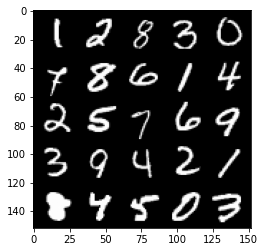

 19%|█▉        | 88/469 [00:07<00:32, 11.70it/s]

Step 9000: Generator loss: 1.9951162338256836, discriminator loss: 0.26698341965675354


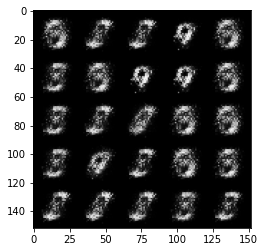

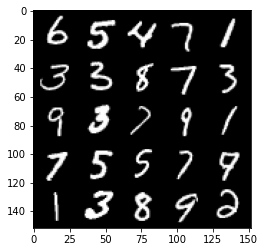

 26%|██▌       | 120/469 [00:10<00:30, 11.54it/s]

Step 9500: Generator loss: 1.8809945583343506, discriminator loss: 0.2619520425796509


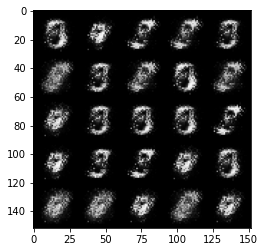

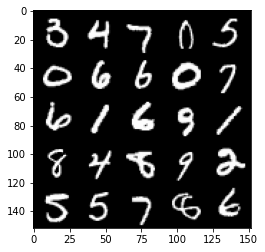

 32%|███▏      | 150/469 [00:12<00:26, 11.82it/s]

Step 10000: Generator loss: 2.1690120697021484, discriminator loss: 0.21061760187149048


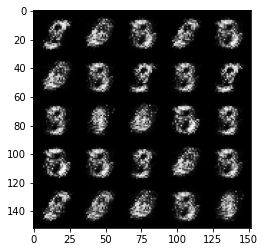

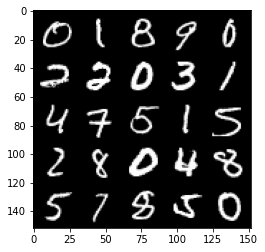

 39%|███▉      | 182/469 [00:15<00:24, 11.85it/s]

Step 10500: Generator loss: 1.871699571609497, discriminator loss: 0.29743891954421997


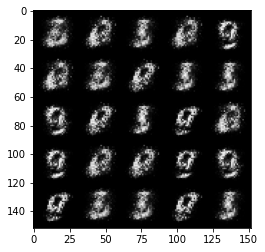

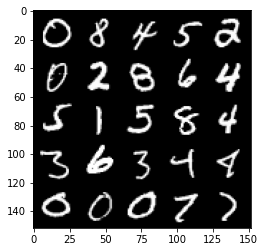

 45%|████▌     | 212/469 [00:17<00:21, 11.84it/s]

Step 11000: Generator loss: 1.8192518949508667, discriminator loss: 0.3226403295993805


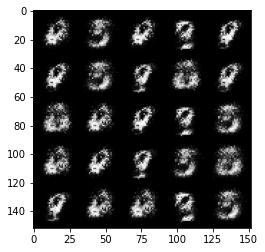

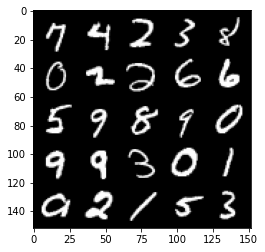

 52%|█████▏    | 244/469 [00:20<00:19, 11.73it/s]

Step 11500: Generator loss: 1.9182449579238892, discriminator loss: 0.2552303075790405


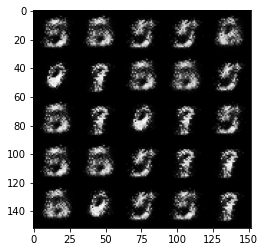

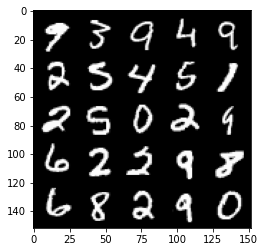

 58%|█████▊    | 274/469 [00:23<00:16, 11.82it/s]

Step 12000: Generator loss: 1.9864082336425781, discriminator loss: 0.24984097480773926


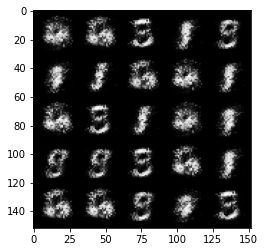

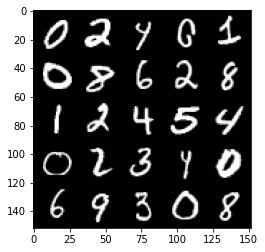

 65%|██████▌   | 306/469 [00:26<00:14, 11.42it/s]

Step 12500: Generator loss: 1.8942705392837524, discriminator loss: 0.3199678063392639


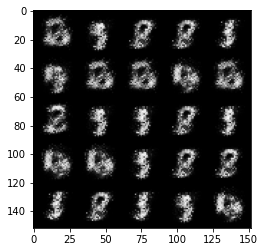

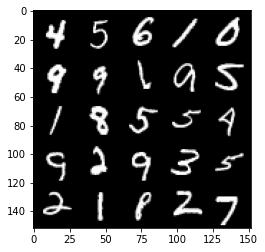

 72%|███████▏  | 336/469 [00:28<00:11, 11.72it/s]

Step 13000: Generator loss: 1.7433209419250488, discriminator loss: 0.35046568512916565


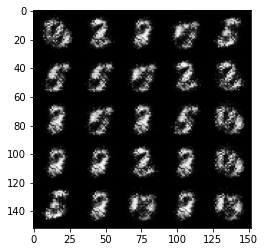

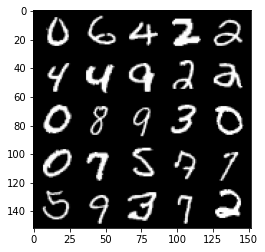

 78%|███████▊  | 368/469 [00:31<00:08, 11.72it/s]

Step 13500: Generator loss: 1.6719285249710083, discriminator loss: 0.3767932653427124


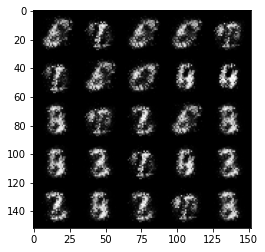

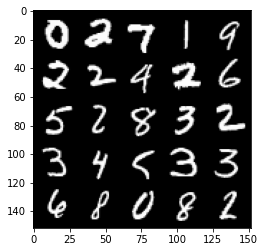

 85%|████████▍ | 398/469 [00:33<00:06, 11.73it/s]

Step 14000: Generator loss: 1.889863133430481, discriminator loss: 0.3229725956916809


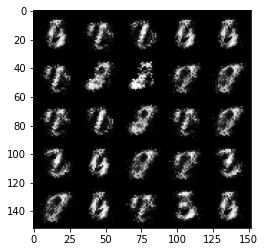

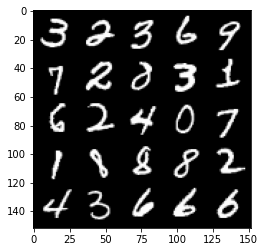

 92%|█████████▏| 430/469 [00:36<00:03, 11.75it/s]

Step 14500: Generator loss: 1.675467848777771, discriminator loss: 0.38464322686195374


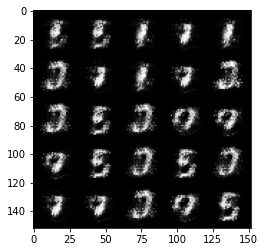

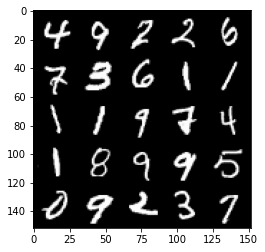

 98%|█████████▊| 460/469 [00:39<00:00, 11.74it/s]

Step 15000: Generator loss: 1.5257295370101929, discriminator loss: 0.44073233008384705


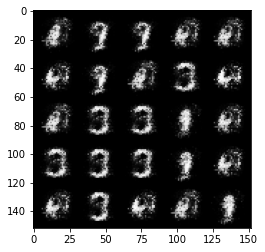

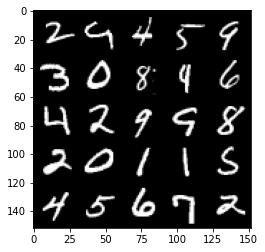

  5%|▍         | 22/469 [00:01<00:38, 11.71it/s]

Step 15500: Generator loss: 1.5942330360412598, discriminator loss: 0.39297589659690857


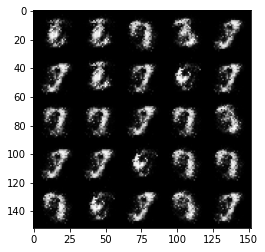

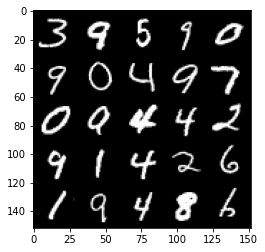

 12%|█▏        | 54/469 [00:04<00:35, 11.76it/s]

Step 16000: Generator loss: 1.701330542564392, discriminator loss: 0.37308621406555176


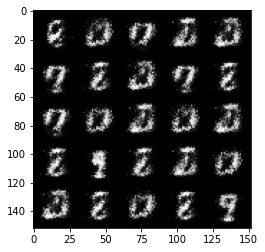

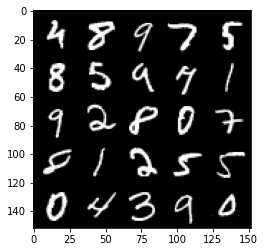

 18%|█▊        | 84/469 [00:07<00:33, 11.41it/s]

Step 16500: Generator loss: 1.7605644464492798, discriminator loss: 0.3354843556880951


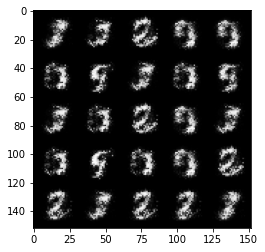

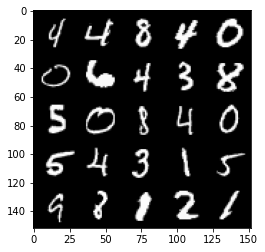

 25%|██▍       | 116/469 [00:09<00:30, 11.70it/s]

Step 17000: Generator loss: 1.7697458267211914, discriminator loss: 0.3521556258201599


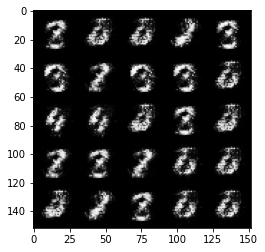

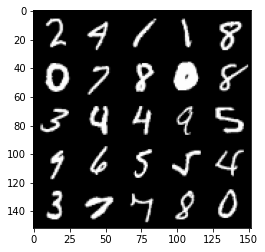

 31%|███       | 146/469 [00:12<00:27, 11.78it/s]

Step 17500: Generator loss: 1.6727101802825928, discriminator loss: 0.36271485686302185


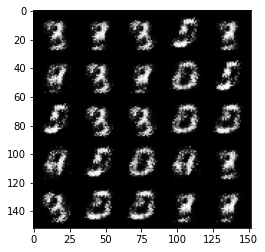

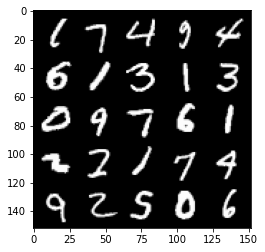

 38%|███▊      | 178/469 [00:15<00:24, 11.74it/s]

Step 18000: Generator loss: 1.7680693864822388, discriminator loss: 0.3351212441921234


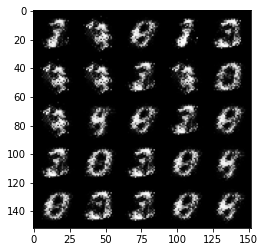

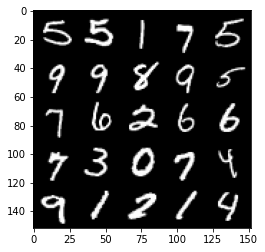

 44%|████▍     | 208/469 [00:17<00:22, 11.70it/s]

Step 18500: Generator loss: 1.9555186033248901, discriminator loss: 0.31041187047958374


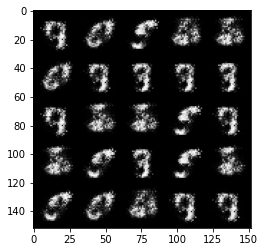

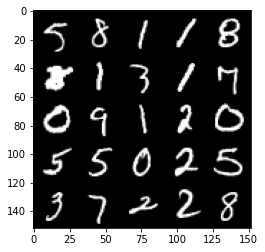

 51%|█████     | 240/469 [00:20<00:19, 11.74it/s]

Step 19000: Generator loss: 1.6274148225784302, discriminator loss: 0.3941892385482788


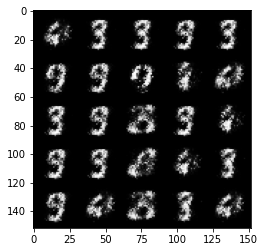

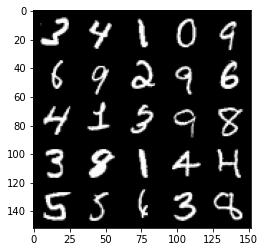

 58%|█████▊    | 270/469 [00:23<00:16, 11.75it/s]

Step 19500: Generator loss: 1.6885437965393066, discriminator loss: 0.39484837651252747


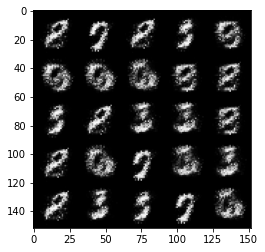

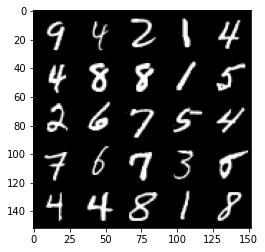

 64%|██████▍   | 302/469 [00:25<00:14, 11.74it/s]

Step 20000: Generator loss: 1.6564007997512817, discriminator loss: 0.3691871166229248


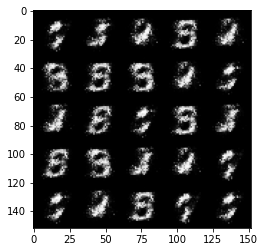

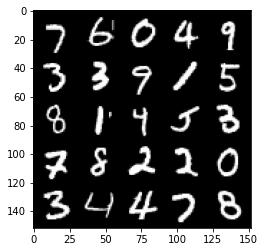

 71%|███████   | 332/469 [00:28<00:11, 11.75it/s]

Step 20500: Generator loss: 1.7560564279556274, discriminator loss: 0.3373250663280487


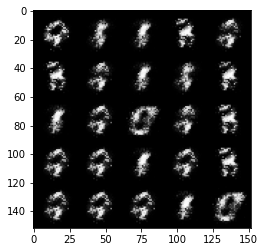

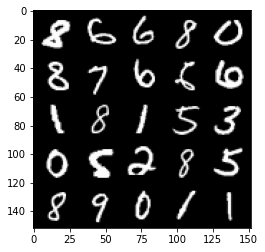

 78%|███████▊  | 364/469 [00:31<00:08, 11.75it/s]

Step 21000: Generator loss: 1.7738813161849976, discriminator loss: 0.332723468542099


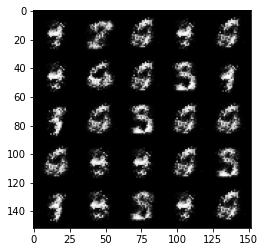

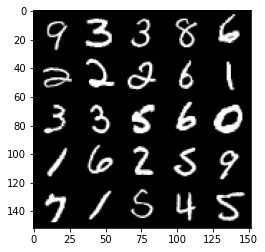

 84%|████████▍ | 394/469 [00:33<00:06, 11.76it/s]

Step 21500: Generator loss: 1.5820026397705078, discriminator loss: 0.4307437539100647


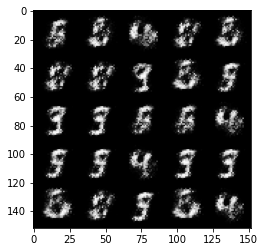

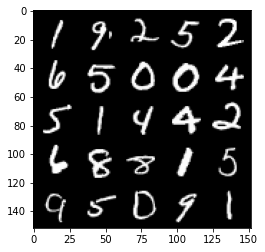

 91%|█████████ | 426/469 [00:36<00:03, 11.74it/s]

Step 22000: Generator loss: 1.5281251668930054, discriminator loss: 0.46441322565078735


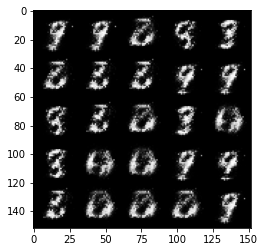

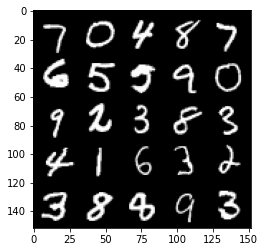

 97%|█████████▋| 456/469 [00:38<00:01, 11.74it/s]

Step 22500: Generator loss: 1.6320213079452515, discriminator loss: 0.3874916136264801


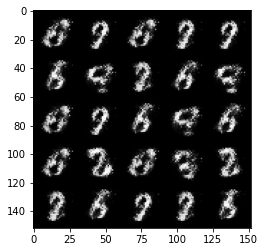

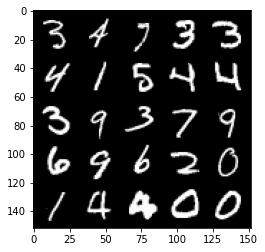

  4%|▍         | 18/469 [00:01<00:38, 11.69it/s]

Step 23000: Generator loss: 1.6390749216079712, discriminator loss: 0.3928174674510956


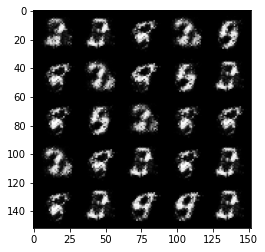

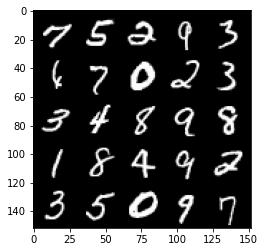

 11%|█         | 50/469 [00:04<00:35, 11.72it/s]

Step 23500: Generator loss: 1.411507248878479, discriminator loss: 0.5332122445106506


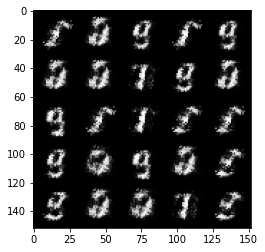

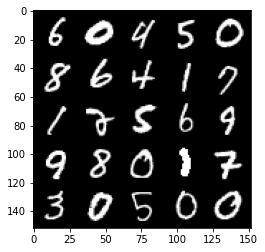

 17%|█▋        | 80/469 [00:06<00:33, 11.75it/s]

Step 24000: Generator loss: 1.49920654296875, discriminator loss: 0.48234549164772034


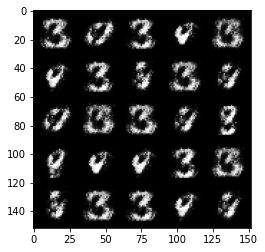

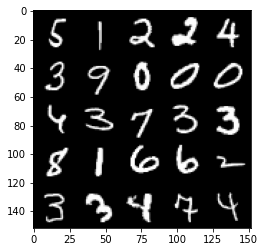

 24%|██▍       | 112/469 [00:09<00:30, 11.72it/s]

Step 24500: Generator loss: 1.5293525457382202, discriminator loss: 0.4497261941432953


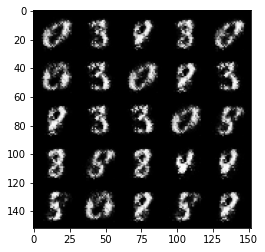

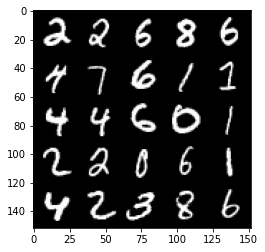

 30%|███       | 142/469 [00:12<00:27, 11.72it/s]

Step 25000: Generator loss: 1.6999213695526123, discriminator loss: 0.3719666600227356


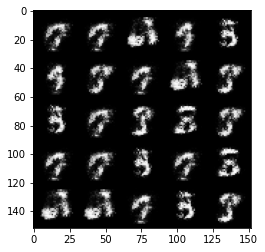

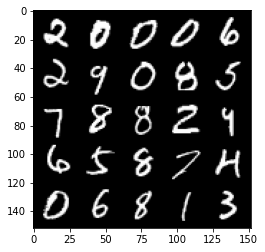

 37%|███▋      | 174/469 [00:14<00:25, 11.73it/s]

Step 25500: Generator loss: 1.5745458602905273, discriminator loss: 0.4069110155105591


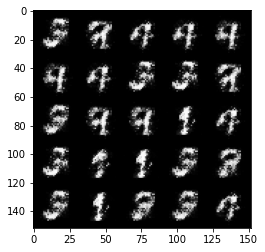

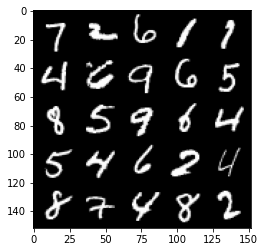

 43%|████▎     | 204/469 [00:17<00:22, 11.73it/s]

Step 26000: Generator loss: 1.6206696033477783, discriminator loss: 0.441030353307724


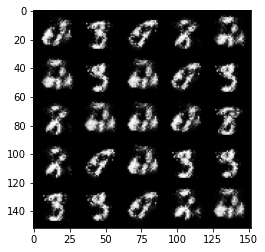

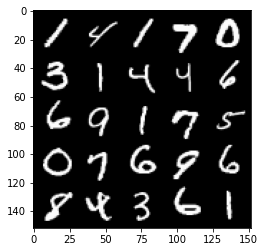

 50%|█████     | 236/469 [00:20<00:19, 11.75it/s]

Step 26500: Generator loss: 1.7413074970245361, discriminator loss: 0.3890218436717987


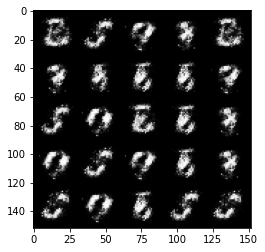

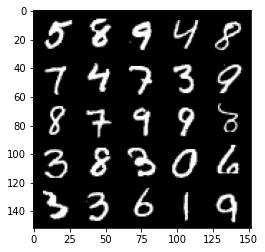

 57%|█████▋    | 266/469 [00:22<00:17, 11.72it/s]

Step 27000: Generator loss: 1.592356562614441, discriminator loss: 0.39775896072387695


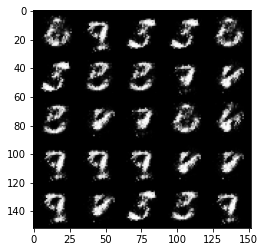

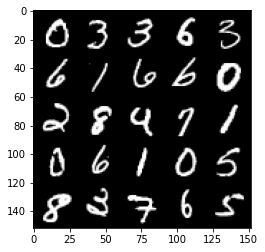

 64%|██████▎   | 298/469 [00:25<00:14, 11.72it/s]

Step 27500: Generator loss: 1.5758835077285767, discriminator loss: 0.39576685428619385


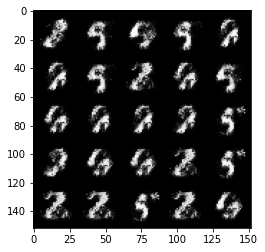

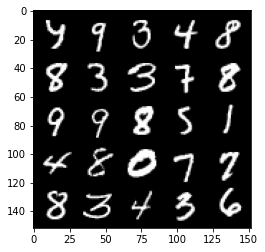

 70%|██████▉   | 328/469 [00:27<00:11, 11.78it/s]

Step 28000: Generator loss: 1.5968648195266724, discriminator loss: 0.4282491207122803


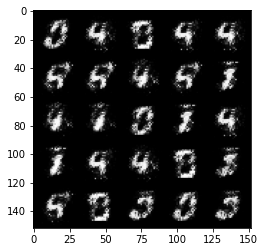

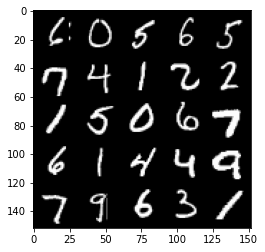

 77%|███████▋  | 360/469 [00:30<00:09, 11.86it/s]

Step 28500: Generator loss: 1.5671467781066895, discriminator loss: 0.4405255615711212


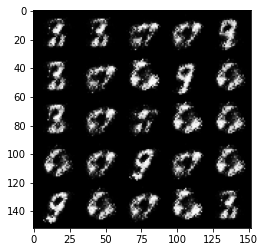

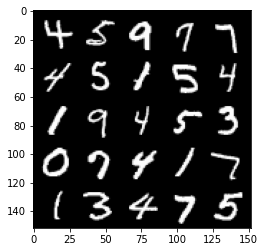

 83%|████████▎ | 390/469 [00:32<00:06, 11.80it/s]

Step 29000: Generator loss: 1.4838591814041138, discriminator loss: 0.4557223916053772


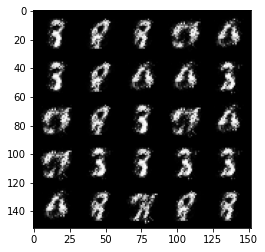

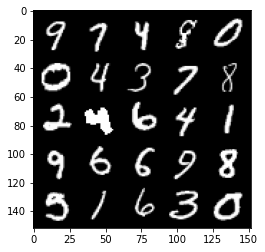

 90%|████████▉ | 422/469 [00:35<00:03, 11.78it/s]

Step 29500: Generator loss: 1.5356101989746094, discriminator loss: 0.43417295813560486


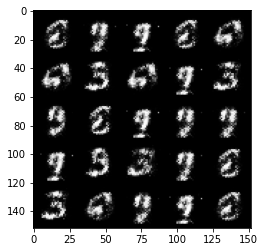

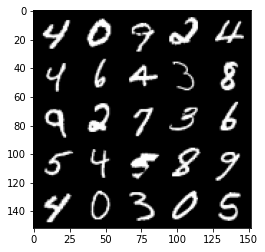

 96%|█████████▋| 452/469 [00:38<00:01, 11.82it/s]

Step 30000: Generator loss: 1.490616798400879, discriminator loss: 0.4921141266822815


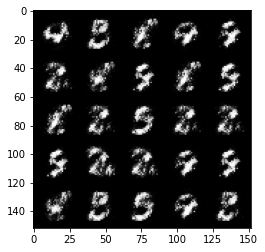

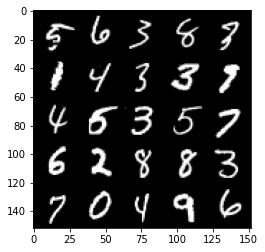

  3%|▎         | 14/469 [00:01<00:38, 11.77it/s]

Step 30500: Generator loss: 1.5292925834655762, discriminator loss: 0.40138912200927734


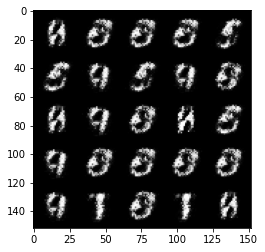

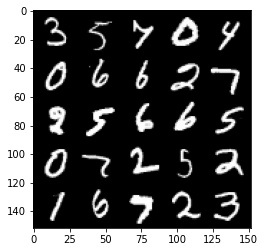

 10%|▉         | 46/469 [00:03<00:35, 11.81it/s]

Step 31000: Generator loss: 1.6312562227249146, discriminator loss: 0.3703581988811493


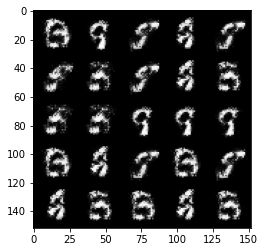

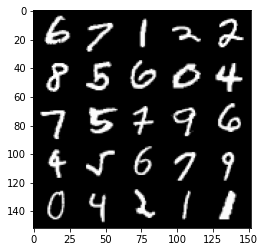

 16%|█▌        | 76/469 [00:06<00:33, 11.70it/s]

Step 31500: Generator loss: 1.5344815254211426, discriminator loss: 0.4236392080783844


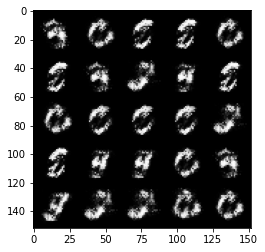

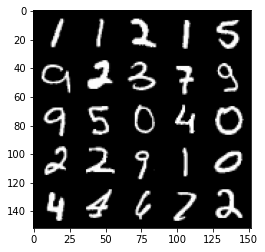

 23%|██▎       | 108/469 [00:09<00:30, 11.80it/s]

Step 32000: Generator loss: 1.5862654447555542, discriminator loss: 0.36104822158813477


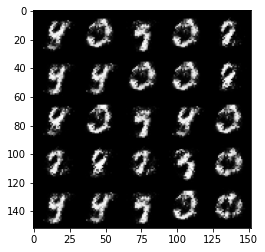

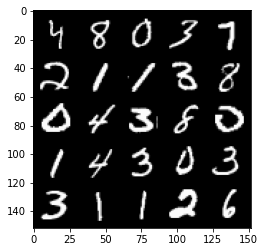

 29%|██▉       | 138/469 [00:11<00:28, 11.77it/s]

Step 32500: Generator loss: 1.586172103881836, discriminator loss: 0.4606161415576935


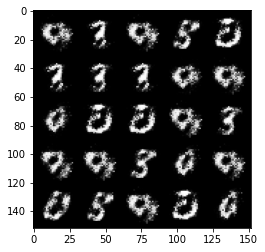

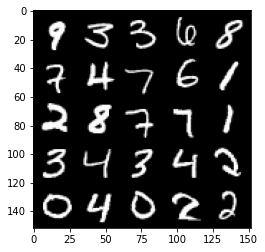

 36%|███▌      | 170/469 [00:14<00:25, 11.82it/s]

Step 33000: Generator loss: 1.4358245134353638, discriminator loss: 0.47575175762176514


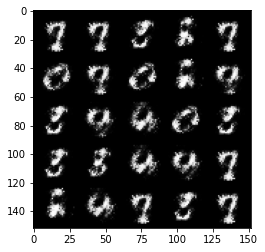

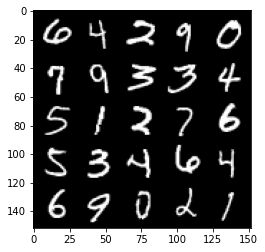

 43%|████▎     | 200/469 [00:16<00:23, 11.56it/s]

Step 33500: Generator loss: 1.5261386632919312, discriminator loss: 0.4351440966129303


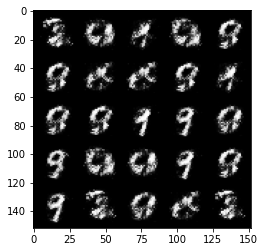

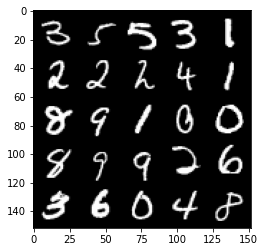

 49%|████▉     | 232/469 [00:19<00:20, 11.79it/s]

Step 34000: Generator loss: 1.4780946969985962, discriminator loss: 0.4570819139480591


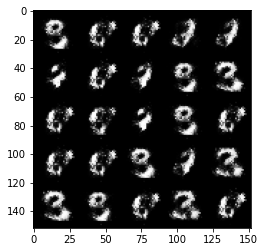

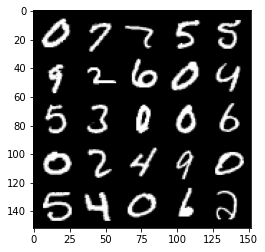

 56%|█████▌    | 262/469 [00:22<00:17, 11.83it/s]

Step 34500: Generator loss: 1.6606342792510986, discriminator loss: 0.41173067688941956


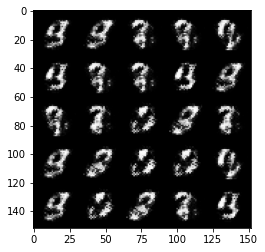

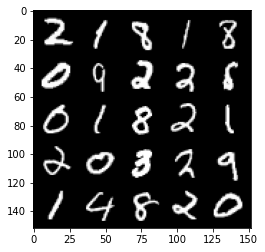

 63%|██████▎   | 294/469 [00:24<00:14, 11.80it/s]

Step 35000: Generator loss: 1.634469747543335, discriminator loss: 0.46843841671943665


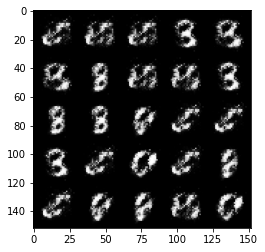

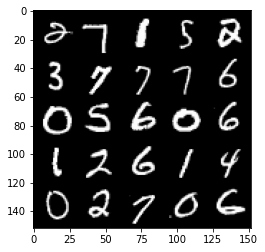

 69%|██████▉   | 324/469 [00:27<00:12, 11.81it/s]

Step 35500: Generator loss: 1.5467497110366821, discriminator loss: 0.4506751000881195


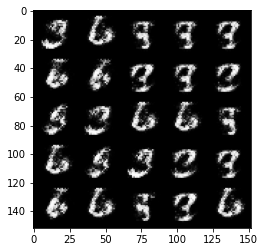

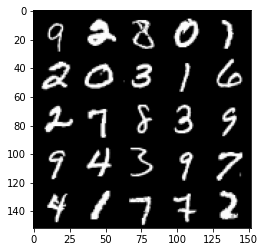

 76%|███████▌  | 356/469 [00:30<00:09, 11.82it/s]

Step 36000: Generator loss: 1.5800358057022095, discriminator loss: 0.39350175857543945


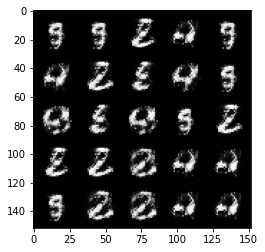

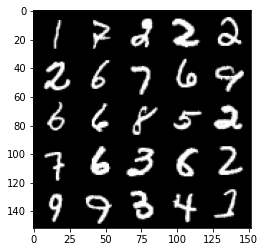

 82%|████████▏ | 386/469 [00:32<00:07, 11.79it/s]

Step 36500: Generator loss: 1.5035555362701416, discriminator loss: 0.4358479976654053


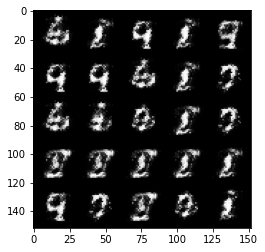

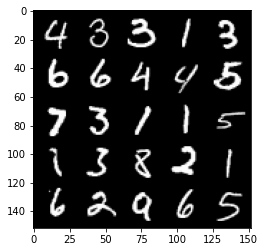

 89%|████████▉ | 418/469 [00:35<00:04, 11.80it/s]

Step 37000: Generator loss: 1.5784595012664795, discriminator loss: 0.43386363983154297


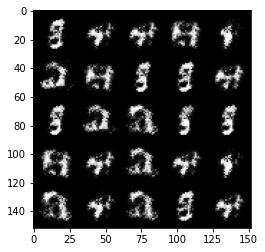

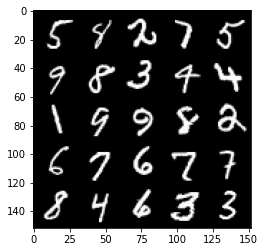

 96%|█████████▌| 448/469 [00:38<00:01, 11.75it/s]

Step 37500: Generator loss: 1.5112204551696777, discriminator loss: 0.42633840441703796


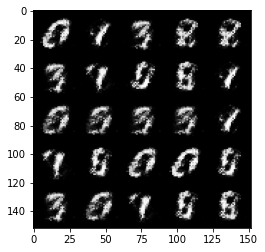

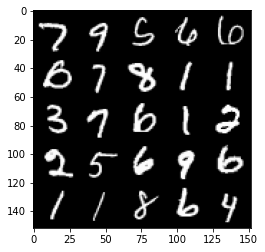

  2%|▏         | 10/469 [00:00<00:39, 11.74it/s]

Step 38000: Generator loss: 1.5857539176940918, discriminator loss: 0.404524564743042


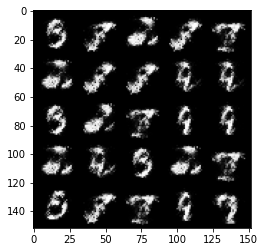

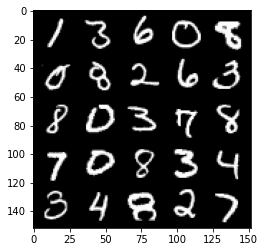

  9%|▉         | 42/469 [00:03<00:36, 11.82it/s]

Step 38500: Generator loss: 1.402746558189392, discriminator loss: 0.4617237448692322


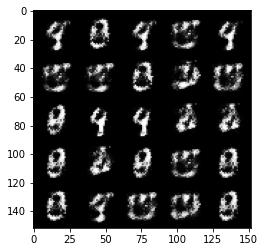

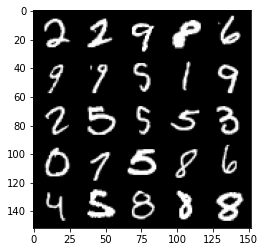

 15%|█▌        | 72/469 [00:06<00:33, 11.79it/s]

Step 39000: Generator loss: 1.5386613607406616, discriminator loss: 0.42259347438812256


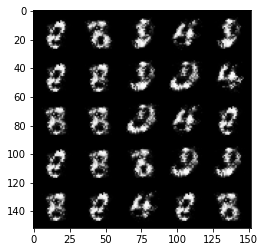

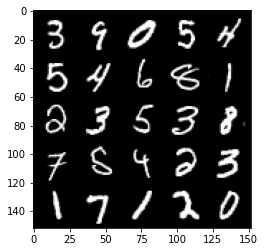

 22%|██▏       | 104/469 [00:08<00:30, 11.82it/s]

Step 39500: Generator loss: 1.3523744344711304, discriminator loss: 0.4959031939506531


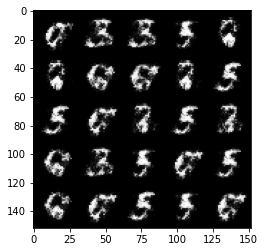

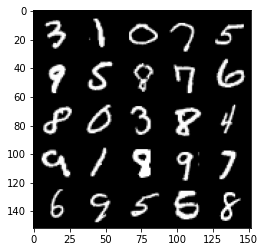

 29%|██▊       | 134/469 [00:11<00:28, 11.81it/s]

Step 40000: Generator loss: 1.4717178344726562, discriminator loss: 0.4698430299758911


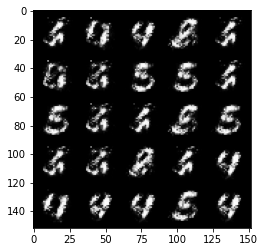

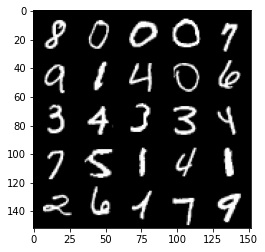

 35%|███▌      | 166/469 [00:14<00:26, 11.62it/s]

Step 40500: Generator loss: 1.447142481803894, discriminator loss: 0.4513101875782013


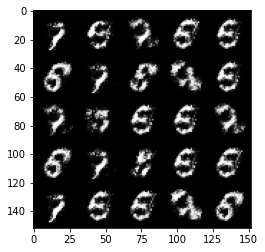

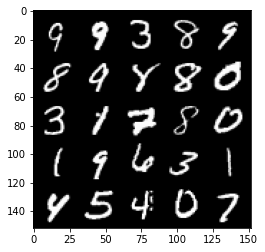

 42%|████▏     | 196/469 [00:16<00:23, 11.72it/s]

Step 41000: Generator loss: 1.4446715116500854, discriminator loss: 0.4391178488731384


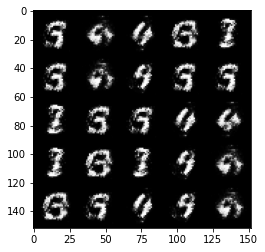

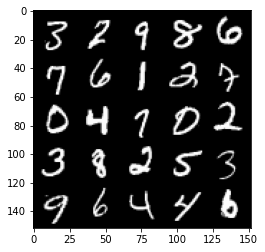

 49%|████▊     | 228/469 [00:19<00:20, 11.70it/s]

Step 41500: Generator loss: 1.4101303815841675, discriminator loss: 0.457558274269104


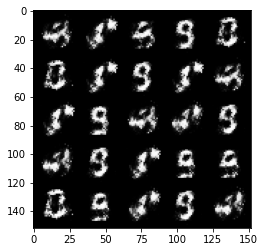

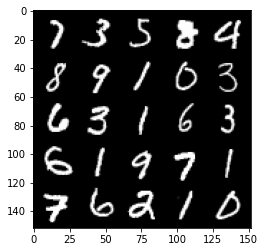

 55%|█████▌    | 258/469 [00:22<00:18, 11.71it/s]

Step 42000: Generator loss: 1.4784390926361084, discriminator loss: 0.45334917306900024


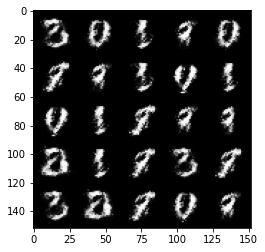

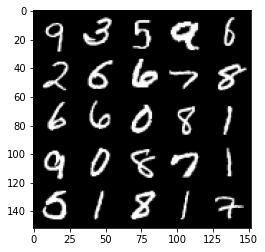

 62%|██████▏   | 290/469 [00:24<00:15, 11.72it/s]

Step 42500: Generator loss: 1.433731198310852, discriminator loss: 0.43469443917274475


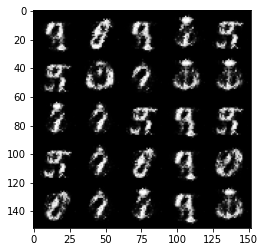

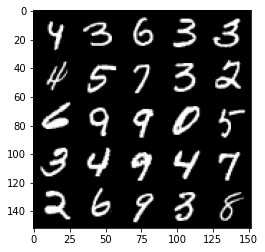

 68%|██████▊   | 320/469 [00:27<00:12, 11.73it/s]

Step 43000: Generator loss: 1.3939759731292725, discriminator loss: 0.4518394470214844


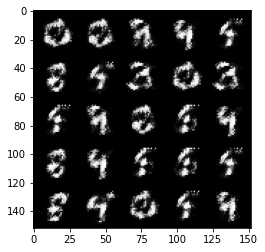

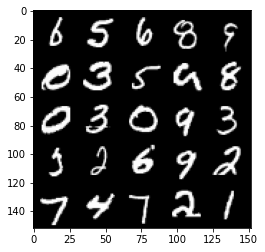

 75%|███████▌  | 352/469 [00:30<00:10, 11.69it/s]

Step 43500: Generator loss: 1.3959171772003174, discriminator loss: 0.4653704762458801


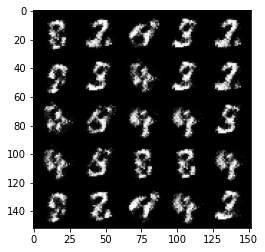

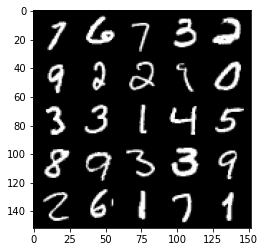

 81%|████████▏ | 382/469 [00:32<00:07, 11.75it/s]

Step 44000: Generator loss: 1.3582642078399658, discriminator loss: 0.5011026859283447


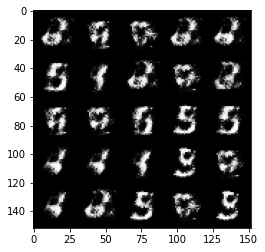

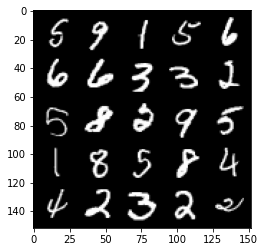

 88%|████████▊ | 413/469 [00:37<00:05, 10.05it/s]

Step 44500: Generator loss: 1.3075251579284668, discriminator loss: 0.5243501663208008


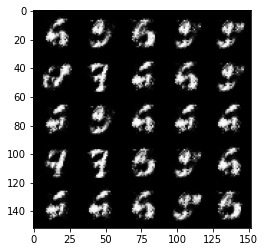

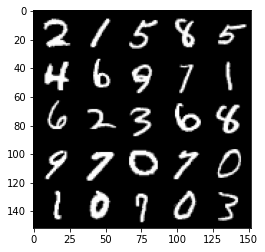

 95%|█████████▍| 444/469 [00:38<00:02, 11.53it/s]

Step 45000: Generator loss: 1.376459002494812, discriminator loss: 0.46151748299598694


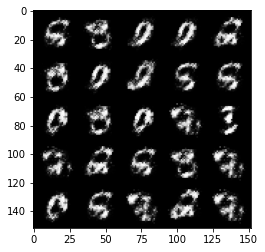

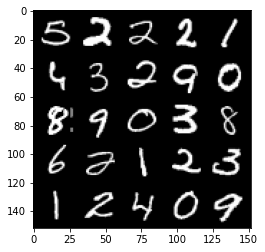

  1%|▏         | 6/469 [00:00<00:39, 11.61it/s]

Step 45500: Generator loss: 1.3154524564743042, discriminator loss: 0.5139240026473999


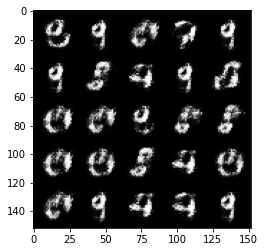

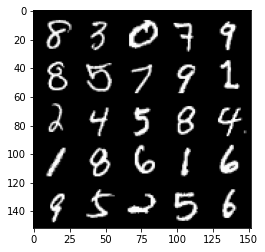

  8%|▊         | 38/469 [00:03<00:36, 11.71it/s]

Step 46000: Generator loss: 1.2476497888565063, discriminator loss: 0.5510194897651672


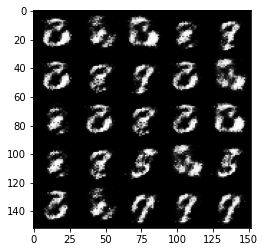

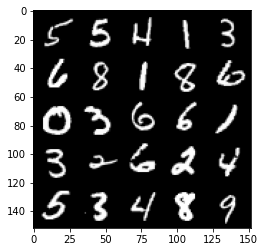

 14%|█▍        | 68/469 [00:05<00:34, 11.64it/s]

Step 46500: Generator loss: 1.3183252811431885, discriminator loss: 0.4950891137123108


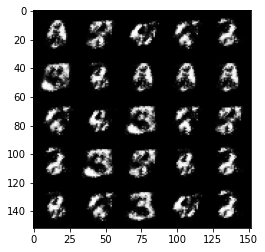

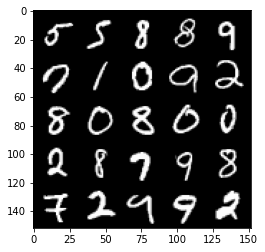

 21%|██▏       | 100/469 [00:08<00:31, 11.75it/s]

Step 47000: Generator loss: 1.290161371231079, discriminator loss: 0.48558667302131653


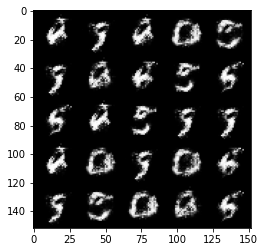

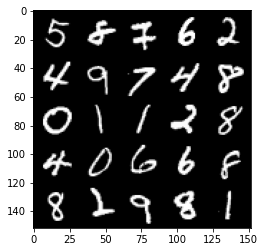

 28%|██▊       | 130/469 [00:11<00:28, 11.73it/s]

Step 47500: Generator loss: 1.400254249572754, discriminator loss: 0.4657931625843048


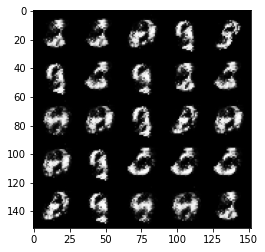

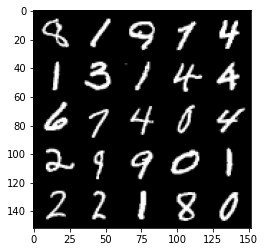

 35%|███▍      | 162/469 [00:13<00:26, 11.72it/s]

Step 48000: Generator loss: 1.4617003202438354, discriminator loss: 0.4490662217140198


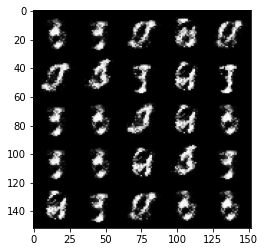

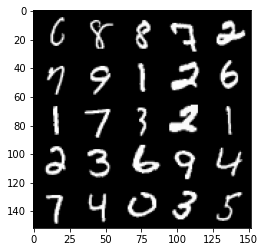

 41%|████      | 192/469 [00:16<00:23, 11.71it/s]

Step 48500: Generator loss: 1.3880926370620728, discriminator loss: 0.462738573551178


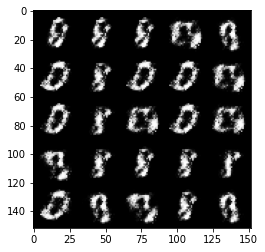

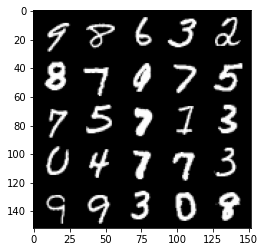

 48%|████▊     | 224/469 [00:19<00:20, 11.73it/s]

Step 49000: Generator loss: 1.4669297933578491, discriminator loss: 0.4337552785873413


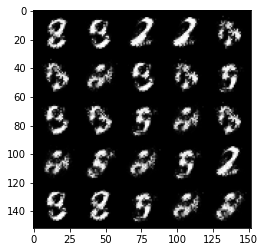

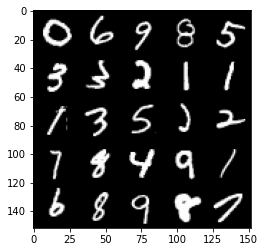

 54%|█████▍    | 254/469 [00:21<00:18, 11.71it/s]

Step 49500: Generator loss: 1.3491994142532349, discriminator loss: 0.46684175729751587


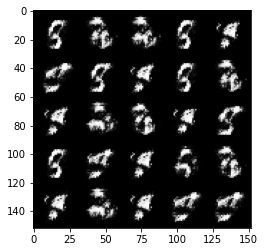

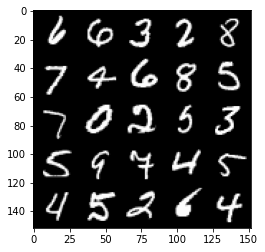

 61%|██████    | 286/469 [00:24<00:15, 11.72it/s]

Step 50000: Generator loss: 1.4198846817016602, discriminator loss: 0.4755726754665375


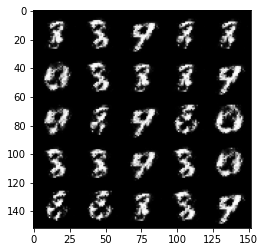

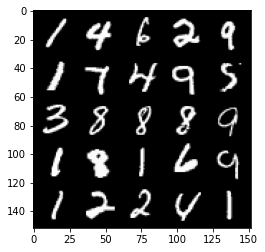

 67%|██████▋   | 316/469 [00:26<00:13, 11.74it/s]

Step 50500: Generator loss: 1.4393640756607056, discriminator loss: 0.38528692722320557


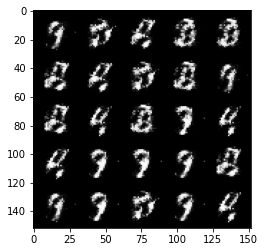

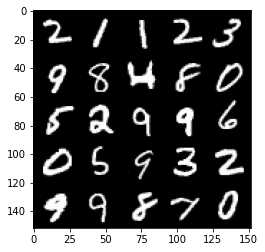

 74%|███████▍  | 348/469 [00:29<00:10, 11.72it/s]

Step 51000: Generator loss: 1.4337410926818848, discriminator loss: 0.4283570349216461


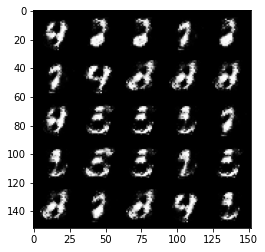

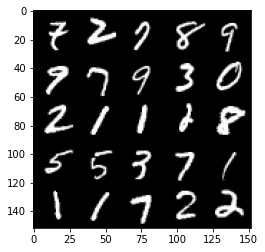

 81%|████████  | 378/469 [00:32<00:07, 11.71it/s]

Step 51500: Generator loss: 1.4211746454238892, discriminator loss: 0.47027587890625


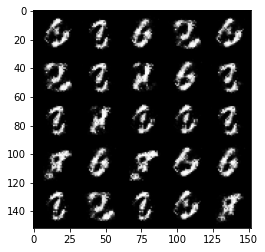

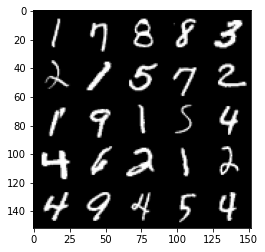

 87%|████████▋ | 410/469 [00:34<00:05, 11.74it/s]

Step 52000: Generator loss: 1.324173927307129, discriminator loss: 0.5019338726997375


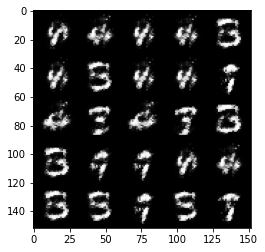

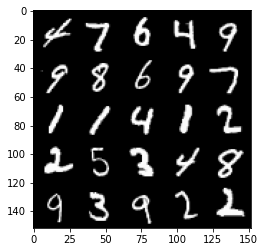

 94%|█████████▍| 440/469 [00:37<00:02, 11.75it/s]

Step 52500: Generator loss: 1.3350915908813477, discriminator loss: 0.4990555942058563


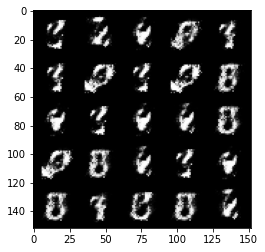

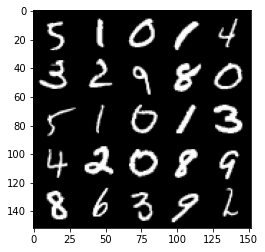

  0%|          | 2/469 [00:00<00:40, 11.53it/s]

Step 53000: Generator loss: 1.4050242900848389, discriminator loss: 0.44701099395751953


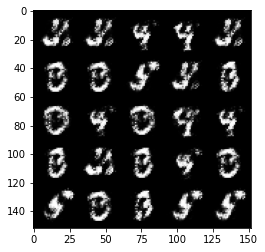

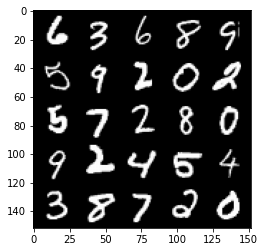

  7%|▋         | 34/469 [00:02<00:37, 11.71it/s]

Step 53500: Generator loss: 1.4642088413238525, discriminator loss: 0.4458053410053253


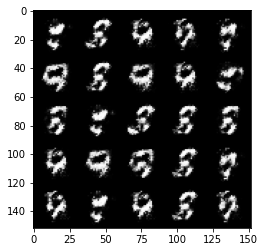

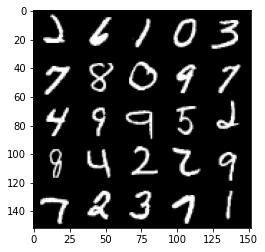

 14%|█▎        | 64/469 [00:05<00:37, 10.80it/s]

Step 54000: Generator loss: 1.3538190126419067, discriminator loss: 0.4911472201347351


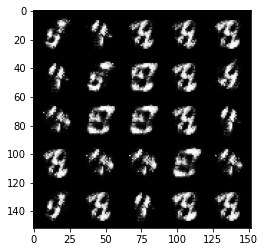

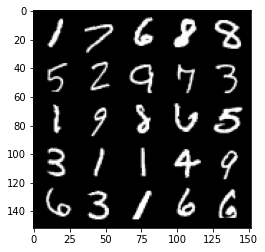

 20%|██        | 96/469 [00:08<00:31, 11.74it/s]

Step 54500: Generator loss: 1.350864291191101, discriminator loss: 0.488440603017807


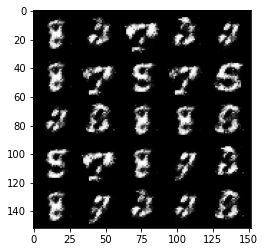

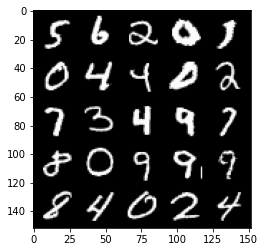

 27%|██▋       | 126/469 [00:10<00:28, 11.91it/s]

Step 55000: Generator loss: 1.2915726900100708, discriminator loss: 0.5257219076156616


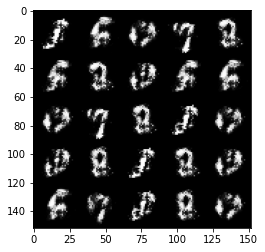

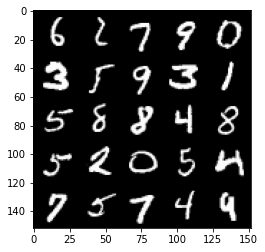

 34%|███▎      | 158/469 [00:13<00:26, 11.89it/s]

Step 55500: Generator loss: 1.2301169633865356, discriminator loss: 0.5165484547615051


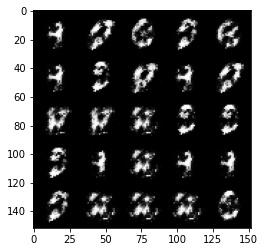

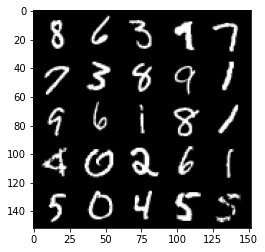

 40%|████      | 188/469 [00:15<00:23, 11.91it/s]

Step 56000: Generator loss: 1.2614727020263672, discriminator loss: 0.5275541543960571


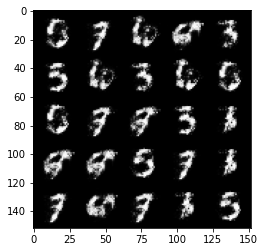

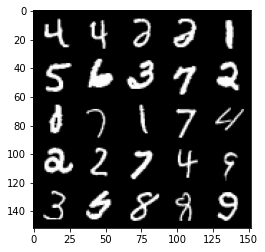

 47%|████▋     | 220/469 [00:18<00:20, 11.89it/s]

Step 56500: Generator loss: 1.307000756263733, discriminator loss: 0.5127518773078918


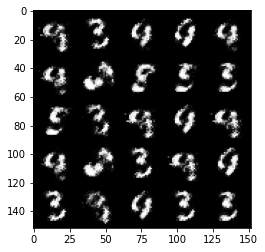

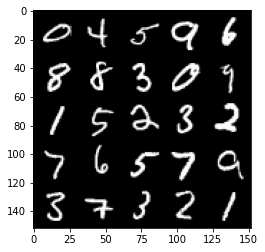

 53%|█████▎    | 250/469 [00:21<00:18, 11.91it/s]

Step 57000: Generator loss: 1.2265276908874512, discriminator loss: 0.5385148525238037


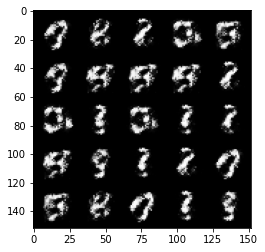

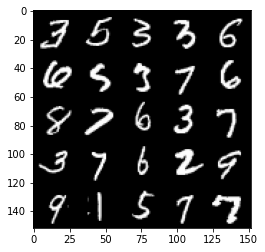

 60%|██████    | 282/469 [00:23<00:15, 11.87it/s]

Step 57500: Generator loss: 1.2541851997375488, discriminator loss: 0.5050336122512817


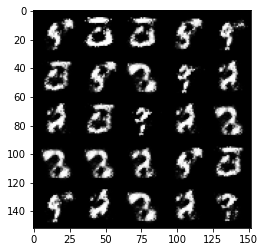

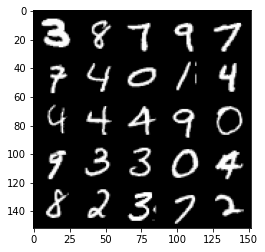

 67%|██████▋   | 312/469 [00:26<00:13, 11.86it/s]

Step 58000: Generator loss: 1.3536391258239746, discriminator loss: 0.5039206147193909


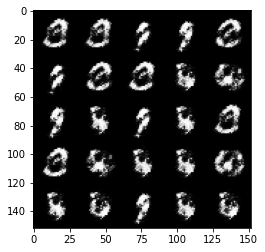

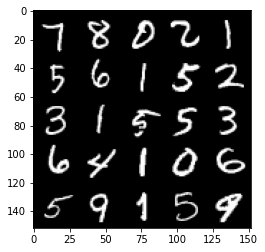

 73%|███████▎  | 344/469 [00:28<00:10, 11.89it/s]

Step 58500: Generator loss: 1.3276764154434204, discriminator loss: 0.4837489724159241


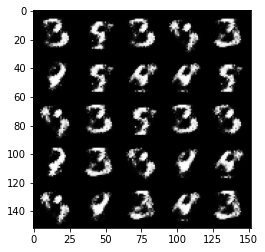

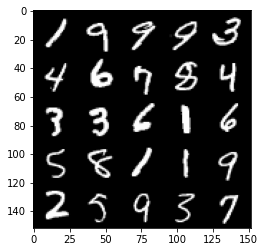

 80%|███████▉  | 374/469 [00:31<00:07, 11.90it/s]

Step 59000: Generator loss: 1.2779181003570557, discriminator loss: 0.47142308950424194


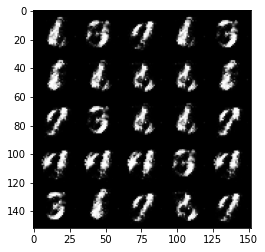

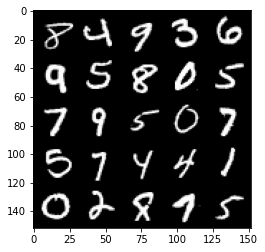

 87%|████████▋ | 406/469 [00:34<00:05, 11.90it/s]

Step 59500: Generator loss: 1.2853449583053589, discriminator loss: 0.4613111615180969


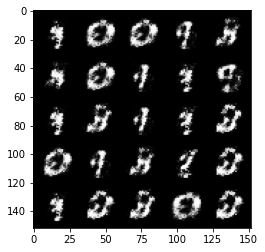

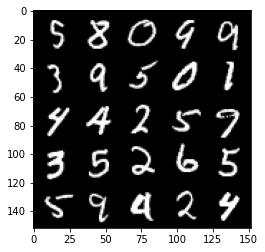

 93%|█████████▎| 436/469 [00:36<00:02, 11.91it/s]

Step 60000: Generator loss: 1.3766769170761108, discriminator loss: 0.4543061852455139


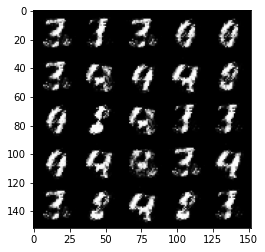

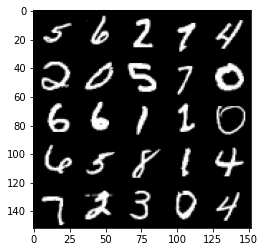

100%|█████████▉| 468/469 [00:39<00:00, 11.91it/s]

Step 60500: Generator loss: 1.449373483657837, discriminator loss: 0.41684988141059875


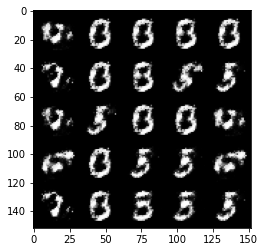

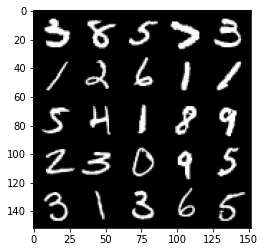

  6%|▋         | 30/469 [00:02<00:37, 11.86it/s]

Step 61000: Generator loss: 1.4047026634216309, discriminator loss: 0.43290746212005615


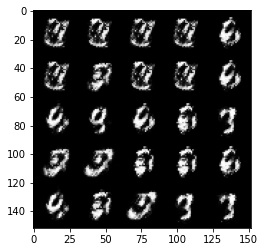

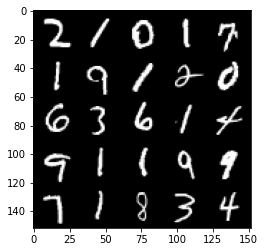

 13%|█▎        | 60/469 [00:05<00:34, 11.87it/s]

Step 61500: Generator loss: 1.389854907989502, discriminator loss: 0.42317429184913635


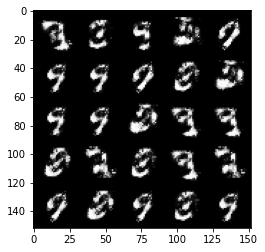

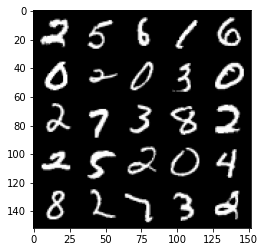

 20%|█▉        | 92/469 [00:07<00:31, 11.89it/s]

Step 62000: Generator loss: 1.4174623489379883, discriminator loss: 0.43883007764816284


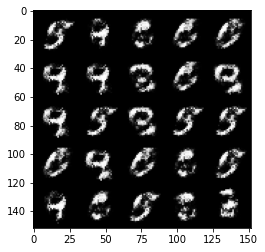

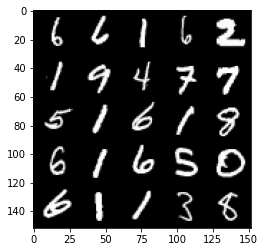

 26%|██▌       | 122/469 [00:10<00:30, 11.42it/s]

Step 62500: Generator loss: 1.398734211921692, discriminator loss: 0.4429260492324829


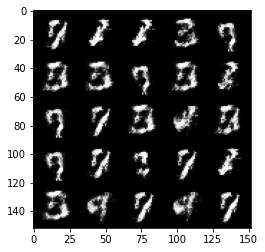

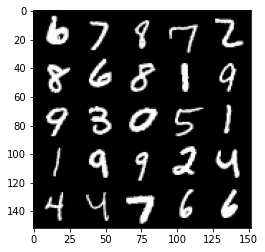

 33%|███▎      | 154/469 [00:13<00:26, 11.75it/s]

Step 63000: Generator loss: 1.355002760887146, discriminator loss: 0.4511912167072296


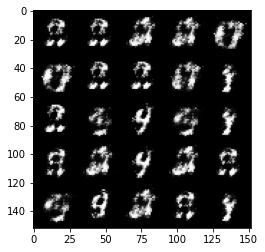

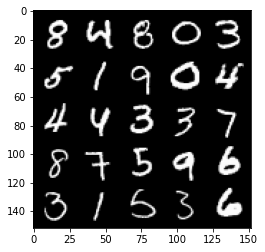

 39%|███▉      | 184/469 [00:15<00:24, 11.76it/s]

Step 63500: Generator loss: 1.3076626062393188, discriminator loss: 0.4964294135570526


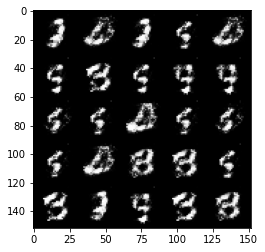

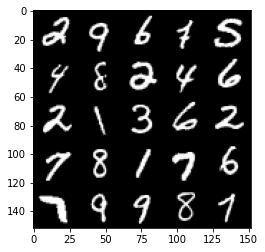

 46%|████▌     | 216/469 [00:18<00:21, 11.77it/s]

Step 64000: Generator loss: 1.306334137916565, discriminator loss: 0.47002559900283813


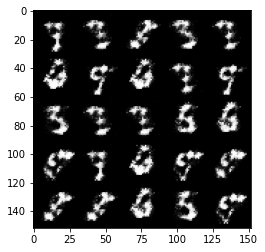

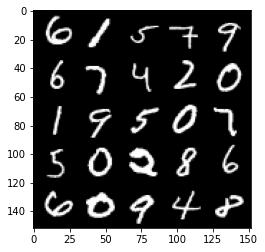

 52%|█████▏    | 246/469 [00:20<00:18, 11.74it/s]

Step 64500: Generator loss: 1.3306865692138672, discriminator loss: 0.4709850549697876


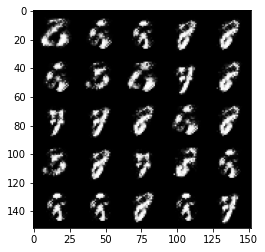

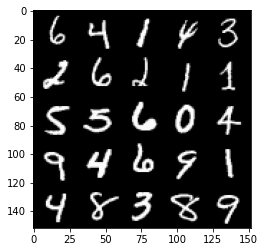

 59%|█████▉    | 278/469 [00:23<00:16, 11.75it/s]

Step 65000: Generator loss: 1.345289707183838, discriminator loss: 0.44538742303848267


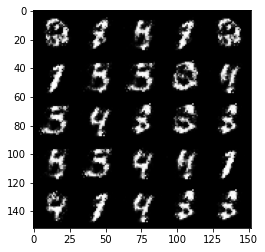

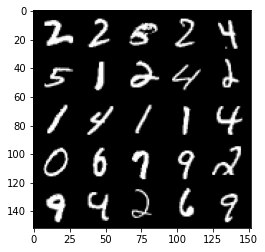

 66%|██████▌   | 308/469 [00:26<00:13, 11.77it/s]

Step 65500: Generator loss: 1.4189924001693726, discriminator loss: 0.4256375730037689


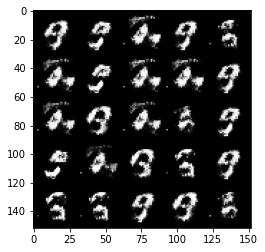

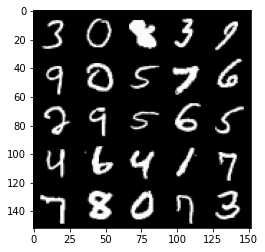

 72%|███████▏  | 340/469 [00:28<00:10, 11.81it/s]

Step 66000: Generator loss: 1.4492052793502808, discriminator loss: 0.48076415061950684


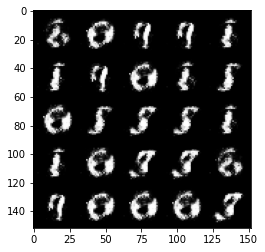

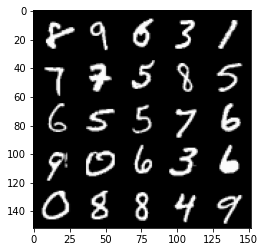

 79%|███████▉  | 370/469 [00:31<00:08, 11.78it/s]

Step 66500: Generator loss: 1.491378664970398, discriminator loss: 0.39829352498054504


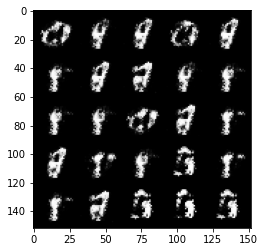

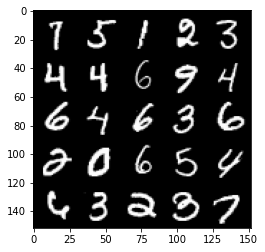

 86%|████████▌ | 402/469 [00:34<00:05, 11.78it/s]

Step 67000: Generator loss: 1.4739670753479004, discriminator loss: 0.3903500437736511


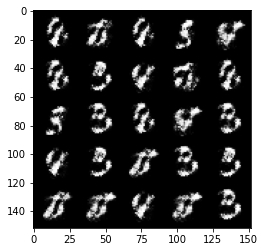

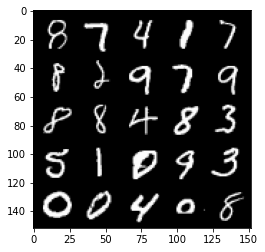

 92%|█████████▏| 432/469 [00:36<00:03, 11.75it/s]

Step 67500: Generator loss: 1.4146983623504639, discriminator loss: 0.4293636977672577


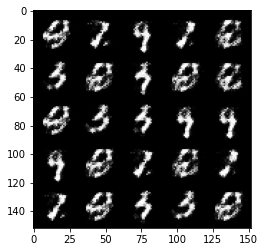

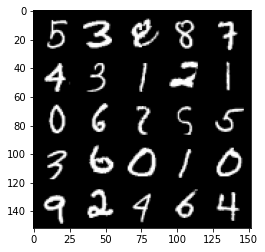

 99%|█████████▉| 464/469 [00:39<00:00, 11.77it/s]

Step 68000: Generator loss: 1.432780146598816, discriminator loss: 0.4086396098136902


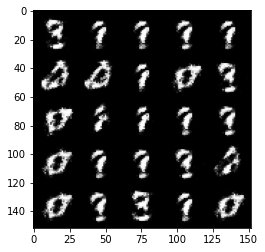

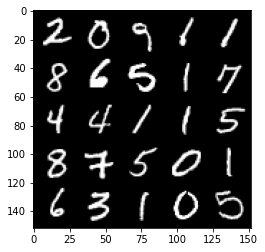

  6%|▌         | 26/469 [00:02<00:37, 11.76it/s]

Step 68500: Generator loss: 1.4290308952331543, discriminator loss: 0.41807398200035095


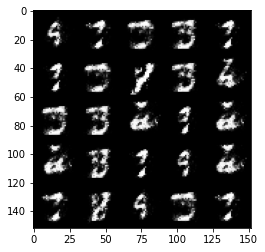

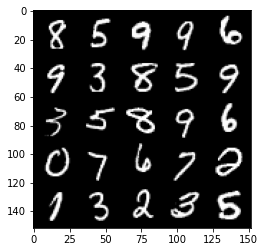

 12%|█▏        | 56/469 [00:04<00:35, 11.77it/s]

Step 69000: Generator loss: 1.4603090286254883, discriminator loss: 0.4261314868927002


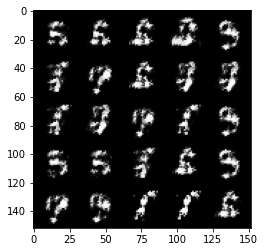

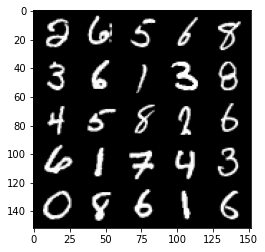

 19%|█▉        | 88/469 [00:07<00:32, 11.78it/s]

Step 69500: Generator loss: 1.3858418464660645, discriminator loss: 0.442547470331192


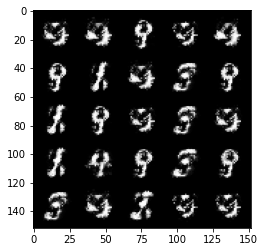

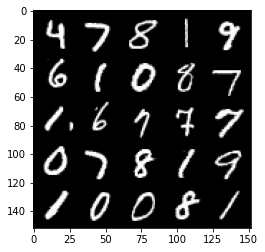

 25%|██▌       | 118/469 [00:10<00:29, 11.77it/s]

Step 70000: Generator loss: 1.3561650514602661, discriminator loss: 0.4690417945384979


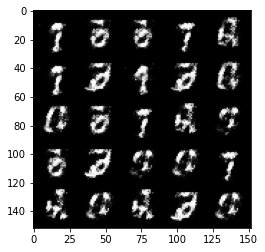

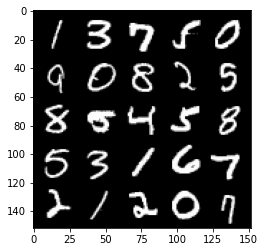

 32%|███▏      | 150/469 [00:12<00:27, 11.77it/s]

Step 70500: Generator loss: 1.458437442779541, discriminator loss: 0.41605323553085327


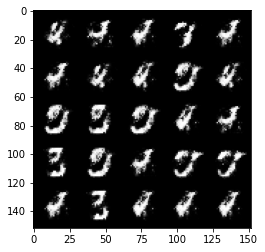

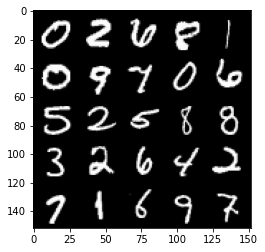

 38%|███▊      | 180/469 [00:15<00:24, 11.78it/s]

Step 71000: Generator loss: 1.4559502601623535, discriminator loss: 0.43896201252937317


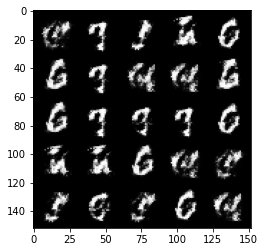

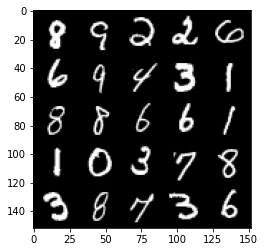

 45%|████▌     | 212/469 [00:18<00:21, 11.78it/s]

Step 71500: Generator loss: 1.3258354663848877, discriminator loss: 0.5041961073875427


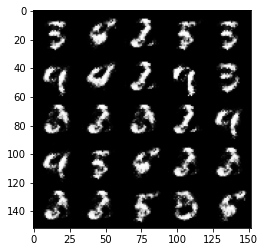

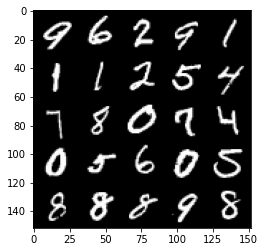

 52%|█████▏    | 242/469 [00:20<00:19, 11.73it/s]

Step 72000: Generator loss: 1.3544964790344238, discriminator loss: 0.45782384276390076


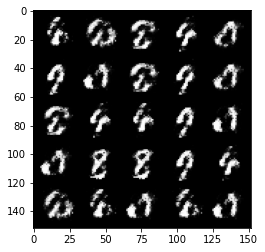

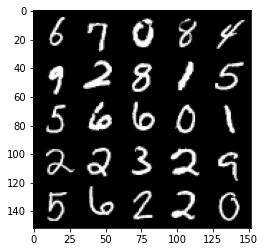

 58%|█████▊    | 274/469 [00:23<00:16, 11.77it/s]

Step 72500: Generator loss: 1.415657639503479, discriminator loss: 0.46362537145614624


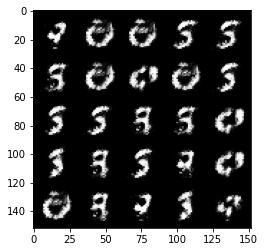

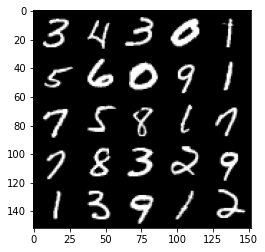

 65%|██████▍   | 304/469 [00:25<00:14, 11.75it/s]

Step 73000: Generator loss: 1.4272727966308594, discriminator loss: 0.43207553029060364


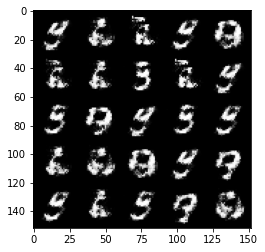

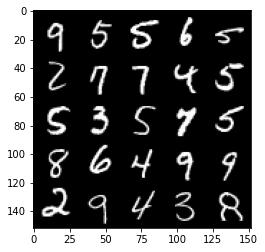

 72%|███████▏  | 336/469 [00:28<00:11, 11.76it/s]

Step 73500: Generator loss: 1.3569186925888062, discriminator loss: 0.46675312519073486


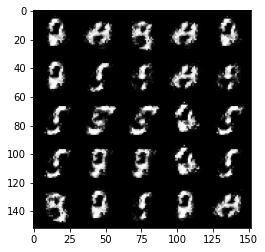

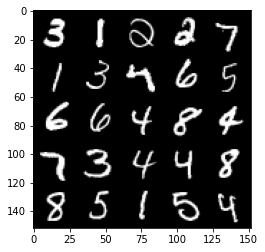

 78%|███████▊  | 366/469 [00:31<00:08, 11.77it/s]

Step 74000: Generator loss: 1.2614856958389282, discriminator loss: 0.5224937200546265


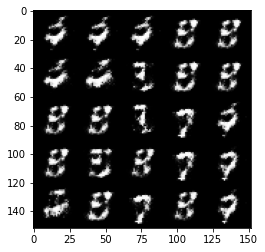

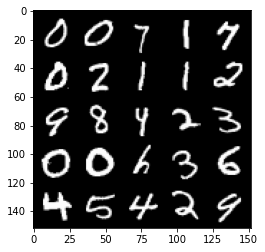

 85%|████████▍ | 398/469 [00:33<00:06, 11.77it/s]

Step 74500: Generator loss: 1.4067139625549316, discriminator loss: 0.44073471426963806


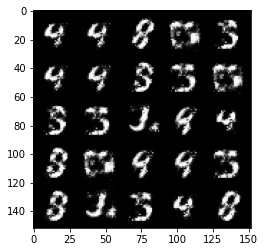

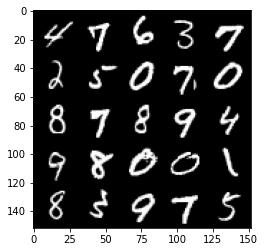

 91%|█████████▏| 428/469 [00:36<00:03, 11.78it/s]

Step 75000: Generator loss: 1.352603554725647, discriminator loss: 0.4902588427066803


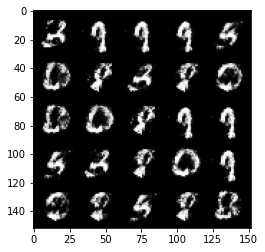

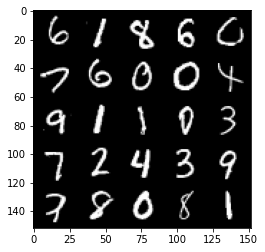

 98%|█████████▊| 460/469 [00:39<00:00, 11.77it/s]

Step 75500: Generator loss: 1.4156521558761597, discriminator loss: 0.45636633038520813


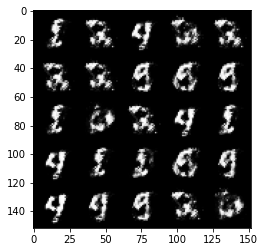

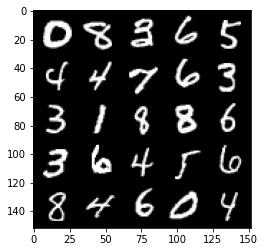

  5%|▍         | 22/469 [00:01<00:37, 11.77it/s]

Step 76000: Generator loss: 1.2171465158462524, discriminator loss: 0.5771216154098511


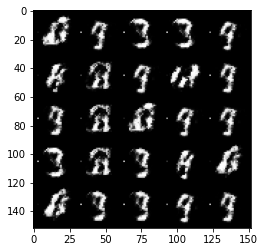

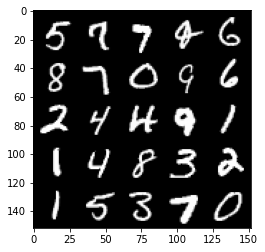

 11%|█         | 52/469 [00:04<00:35, 11.75it/s]

Step 76500: Generator loss: 1.4224274158477783, discriminator loss: 0.4377478361129761


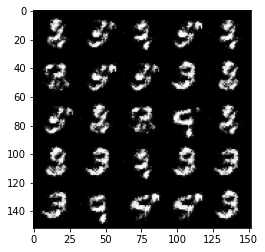

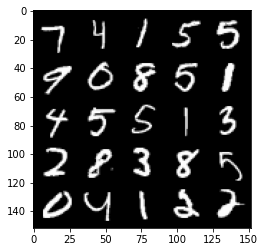

 18%|█▊        | 84/469 [00:07<00:32, 11.80it/s]

Step 77000: Generator loss: 1.4473108053207397, discriminator loss: 0.4222347140312195


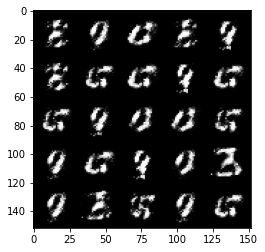

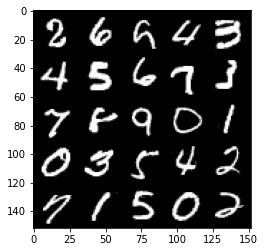

 24%|██▍       | 114/469 [00:09<00:29, 11.84it/s]

Step 77500: Generator loss: 1.4206581115722656, discriminator loss: 0.44354137778282166


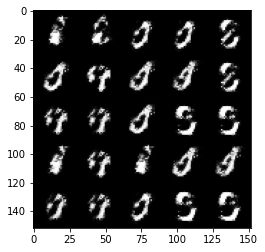

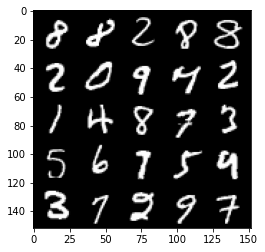

 31%|███       | 146/469 [00:12<00:27, 11.83it/s]

Step 78000: Generator loss: 1.4134886264801025, discriminator loss: 0.4563004672527313


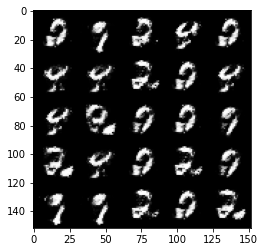

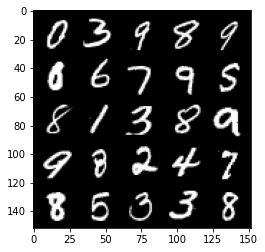

 38%|███▊      | 176/469 [00:14<00:24, 11.84it/s]

Step 78500: Generator loss: 1.436089038848877, discriminator loss: 0.43084967136383057


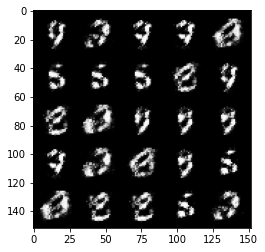

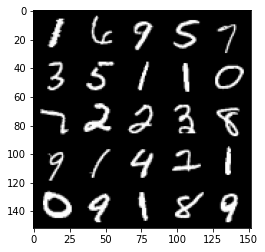

 44%|████▍     | 208/469 [00:17<00:22, 11.83it/s]

Step 79000: Generator loss: 1.4740875959396362, discriminator loss: 0.40509557723999023


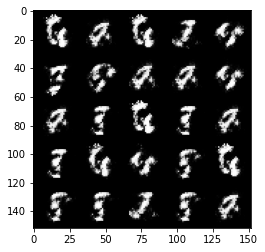

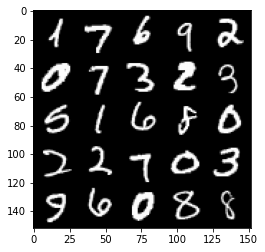

 51%|█████     | 238/469 [00:20<00:19, 11.83it/s]

Step 79500: Generator loss: 1.4736179113388062, discriminator loss: 0.4315171539783478


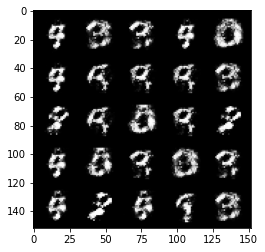

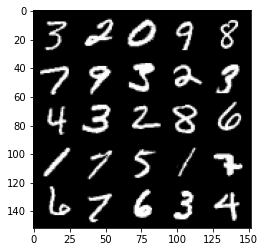

 58%|█████▊    | 270/469 [00:22<00:16, 11.82it/s]

Step 80000: Generator loss: 1.523527979850769, discriminator loss: 0.3908931612968445


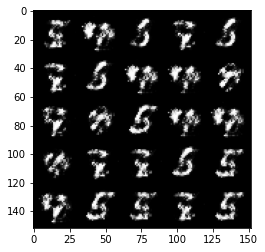

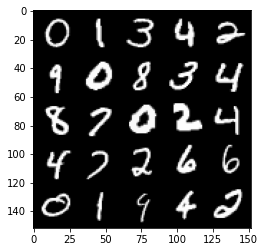

 64%|██████▍   | 300/469 [00:25<00:14, 11.84it/s]

Step 80500: Generator loss: 1.4549535512924194, discriminator loss: 0.4245465099811554


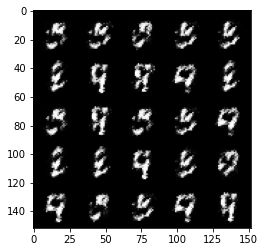

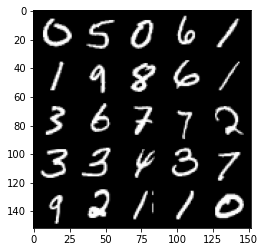

 71%|███████   | 332/469 [00:28<00:11, 11.84it/s]

Step 81000: Generator loss: 1.5624616146087646, discriminator loss: 0.4054669141769409


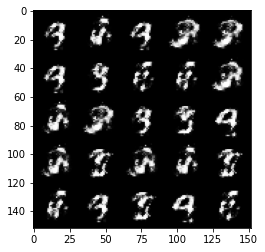

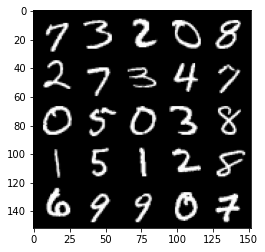

 77%|███████▋  | 362/469 [00:30<00:09, 11.80it/s]

Step 81500: Generator loss: 1.566263198852539, discriminator loss: 0.4136406481266022


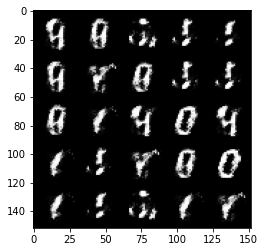

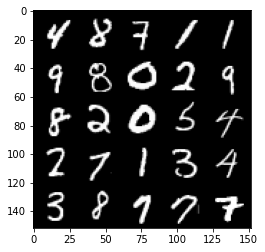

 84%|████████▍ | 394/469 [00:33<00:06, 11.86it/s]

Step 82000: Generator loss: 1.5639655590057373, discriminator loss: 0.4397316873073578


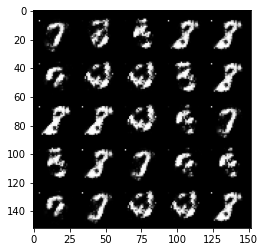

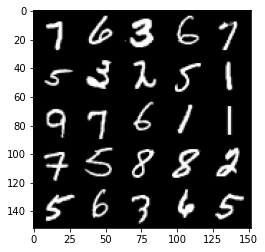

 90%|█████████ | 424/469 [00:35<00:03, 11.85it/s]

Step 82500: Generator loss: 1.2573752403259277, discriminator loss: 0.5681737065315247


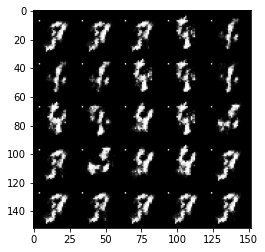

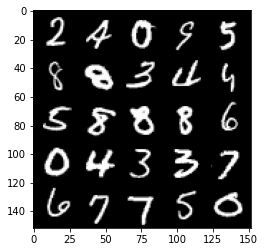

 97%|█████████▋| 456/469 [00:38<00:01, 11.83it/s]

Step 83000: Generator loss: 1.4804681539535522, discriminator loss: 0.42294594645500183


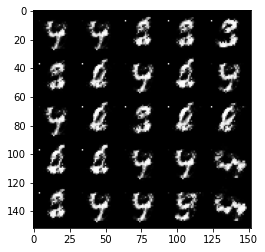

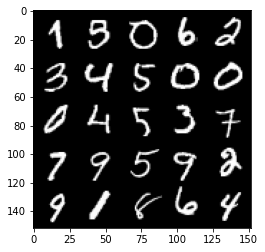

  4%|▍         | 18/469 [00:01<00:38, 11.81it/s]

Step 83500: Generator loss: 1.5178757905960083, discriminator loss: 0.39788907766342163


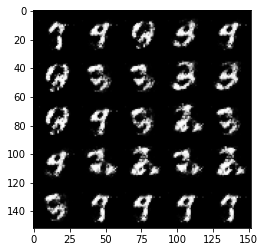

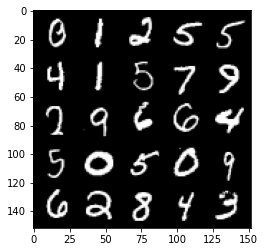

 10%|█         | 48/469 [00:04<00:35, 11.75it/s]

Step 84000: Generator loss: 1.4862537384033203, discriminator loss: 0.4534558653831482


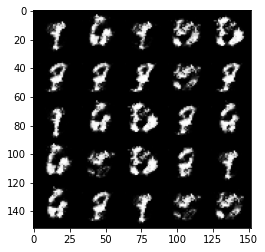

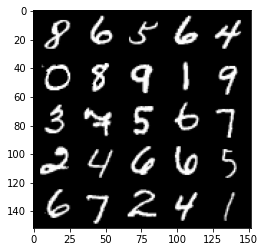

 17%|█▋        | 80/469 [00:06<00:33, 11.71it/s]

Step 84500: Generator loss: 1.5153236389160156, discriminator loss: 0.42192286252975464


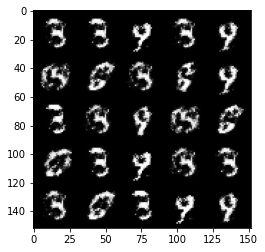

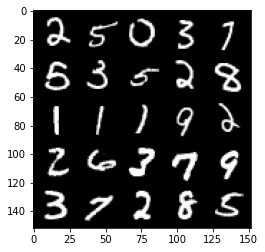

 23%|██▎       | 110/469 [00:09<00:30, 11.72it/s]

Step 85000: Generator loss: 1.4320251941680908, discriminator loss: 0.45664283633232117


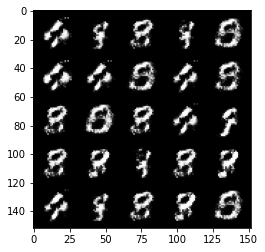

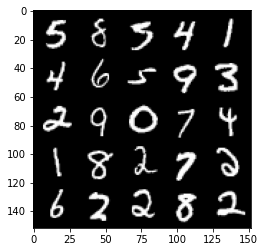

 30%|███       | 142/469 [00:12<00:27, 11.74it/s]

Step 85500: Generator loss: 1.5936012268066406, discriminator loss: 0.394457072019577


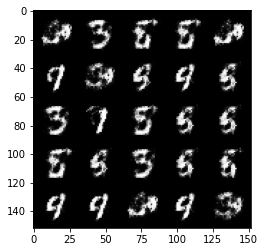

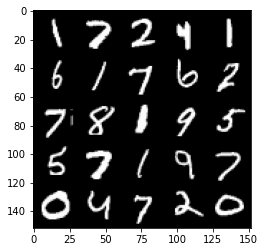

 37%|███▋      | 172/469 [00:14<00:25, 11.75it/s]

Step 86000: Generator loss: 1.4631192684173584, discriminator loss: 0.4661552906036377


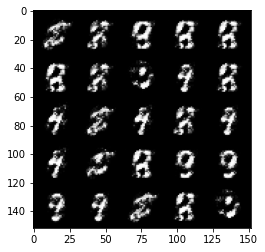

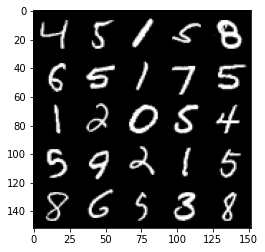

 43%|████▎     | 204/469 [00:17<00:22, 11.71it/s]

Step 86500: Generator loss: 1.4990549087524414, discriminator loss: 0.4229939579963684


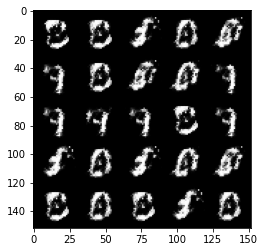

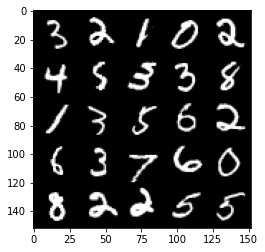

 50%|████▉     | 234/469 [00:19<00:19, 11.77it/s]

Step 87000: Generator loss: 1.6652467250823975, discriminator loss: 0.36992040276527405


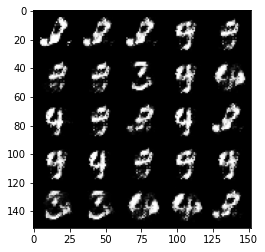

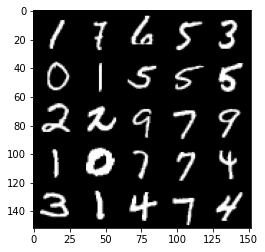

 57%|█████▋    | 266/469 [00:22<00:17, 11.75it/s]

Step 87500: Generator loss: 1.5585730075836182, discriminator loss: 0.42814144492149353


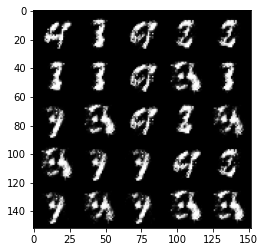

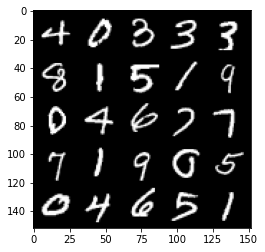

 63%|██████▎   | 296/469 [00:25<00:14, 11.75it/s]

Step 88000: Generator loss: 1.574946641921997, discriminator loss: 0.40546032786369324


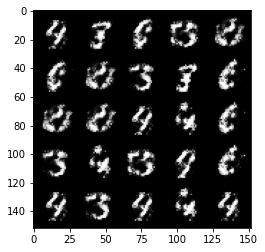

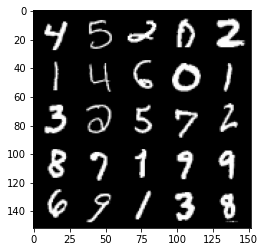

 44%|████▍     | 208/469 [00:17<00:22, 11.61it/s]


KeyboardInterrupt: 

In [44]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss=get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        #if test_generator:
            #assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
